In [3]:
from scipy.io import loadmat
import networkx as nx
import pandas as pd
import csv
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from sklearn.cluster import KMeans
import time
from sklearn.decomposition import KernelPCA
from Functions import *
from Triangles import *
from Laplacians import *
#cmap = plt.cm.get_cmap("jet")
#cmap = plt.cm.get_cmap("RdYlBu")
#cmap = plt.cm.get_cmap("cool")
cmap = plt.cm.get_cmap("viridis")
%matplotlib inline

# Load Data

In [4]:
path = "../Source/APBC2018/APBC-GitHub.mat"
name_path= "../Source/APBC2018/drug_name_568.txt"
data=loadmat(path)
name=pd.read_csv(name_path, header=None)

file = open(name_path, "r")
name =file.read()
name = name.split("\n")
file.close()
#data

In [5]:
DDI_binary=data["DDI_binary"] # adjacncy matrix
DDI_triple=data["DDI_triple"] # signed network
offisides_feature=data["offsides_feature"]
pca_offisides=data["pca_offisides"]
pca_structure=data["pca_structure"]
structure_feature=data["structure_feature"] #feature vector based on PubChem structure descriptor

In [6]:
offisides_feature.shape

(568, 9149)

In [7]:
#check if data was loaded correct
assert offisides_feature.shape == (568, 9149)
assert DDI_binary.shape == (568, 568)
assert np.all(DDI_triple**2 == DDI_binary)

# Build Networkx Graph

In [8]:
G_binary = nx.from_numpy_matrix(DDI_binary)

In [9]:
name_mapping= {i: name[i] for i in range(len(G_binary.nodes))}
Gb = nx.relabel_nodes(G_binary, name_mapping)

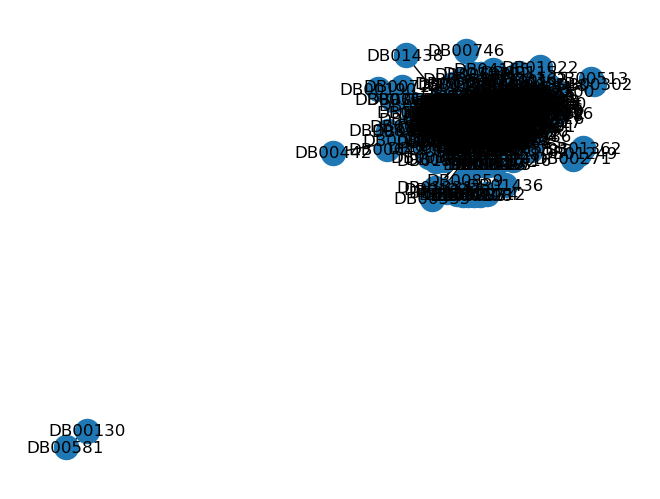

In [10]:
nx.draw(Gb, with_labels=True)

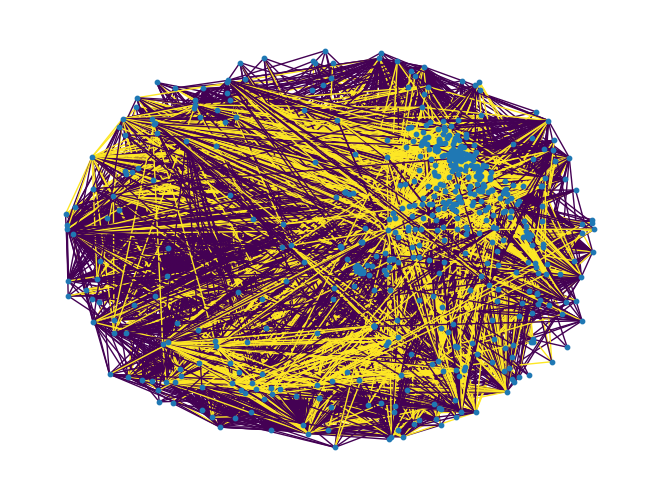

In [11]:
Gt=nx.from_numpy_matrix(DDI_triple)
name_mapping= {i: name[i] for i in range(len(Gt.nodes))}
Gt= nx.relabel_nodes(Gt, name_mapping)
edges,w = zip(*nx.get_edge_attributes(Gt,'weight').items())
nx.draw(Gt, with_labels=False, edge_color=w, node_size=10)
G=Gt
A = nx.to_numpy_array(Gt)
BC=False

## Look at largest connected Graph

In [12]:
""" 
#two nodes not connnected with the big component
small_nodes=list(list(nx.connected_components(Gt))[-1])
filters=np.ones((len(name)), dtype=bool)

for sn in small_nodes:
    i = name.index(sn)
    #filters[i, :]=False
    #filters[:, i]=False
    filters[i]=False
    
    #remove disjoint node infromation
pca_offisidesBC=pca_offisides[filters]
pca_structureBC=pca_structure[filters]
structure_featureBC=structure_feature[filters]
offisides_featureBC=offisides_feature[filters]
BC=list(nx.connected_components(Gt))[0]
Gt=Gt.subgraph(BC)


A = nx.to_numpy_array(Gt)

labels = nx.get_edge_attributes(Gt, "weight")
l= list(labels)
BC=True
"""


' \n#two nodes not connnected with the big component\nsmall_nodes=list(list(nx.connected_components(Gt))[-1])\nfilters=np.ones((len(name)), dtype=bool)\n\nfor sn in small_nodes:\n    i = name.index(sn)\n    #filters[i, :]=False\n    #filters[:, i]=False\n    filters[i]=False\n    \n    #remove disjoint node infromation\npca_offisidesBC=pca_offisides[filters]\npca_structureBC=pca_structure[filters]\nstructure_featureBC=structure_feature[filters]\noffisides_featureBC=offisides_feature[filters]\nBC=list(nx.connected_components(Gt))[0]\nGt=Gt.subgraph(BC)\n\n\nA = nx.to_numpy_array(Gt)\n\nlabels = nx.get_edge_attributes(Gt, "weight")\nl= list(labels)\nBC=True\n'

In [13]:
start=time.time()
n_ub, n_wb, n_sb, Ntri = triad_types(Gt)
print("unbalanced: {}".format(n_ub))
print("weakly balanced: {}".format(n_wb))
print("strongly balanced: {}".format(n_sb))
print("total triangles: {}".format(Ntri))
print("time: {} s".format(time.time()-start))

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\Users\sujen\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3457, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\sujen\AppData\Local\Temp\ipykernel_16200\576365190.py", line 2, in <module>
    n_ub, n_wb, n_sb, Ntri = triad_types(Gt)
  File "C:\Users\sujen\Documents\HS22_Programme\HS2022_MAT933_Project\Code\Triangles.py", line 35, in triad_types
    triangles = triangle_list(G)#[c for c in nx.enumerate_all_cliques(G) if len(c)==3]  #[c for c in nx.cycle_basis(G) if len(c)==3]
  File "C:\Users\sujen\Documents\HS22_Programme\HS2022_MAT933_Project\Code\Triangles.py", line 19, in triangle_list
    for each_clique_all_size in nx.enumerate_all_cliques(G) :
  File "C:\Users\sujen\Anaconda3\lib\site-packages\networkx\utils\decorators.py", line 790, in func
    yield from argmap._lazy_compile(__wrapper)(*args, **kwargs)
  File "<class 'networkx.utils.decorators.argmap'> compilation 16", line 4,

TypeError: object of type 'NoneType' has no len()

In [173]:
start=time.time()
cbi_global=CBI(Gt, np.ones(len(list(Gt.nodes()))))
print("time: {} s".format(time.time() -start))
print("cbi global: {}".format(cbi_global))

unbalanced triangels: 46478 , 9.767261035399438%
weakly balanced: 7773, 1.6334807872145929%
strongly balanced: 421604, 88.59925817738596%
total triangles: 475855
time: 612.3779377937317 s
cbi global: 90.23273896460056


In [14]:

def calculate_difference(group_labels, Gt):
    
    nodes=list(Gt.nodes())
    nodes=np.asarray(nodes)
    values, counts = np.unique(group_labels, return_counts=True)
    N=len(values)
    db=np.zeros((N,N))
    
    for i,ci in enumerate(values):
        for j, cj in enumerate(values):
            if ci!=cj:
                ci_nodes = (group_labels==ci)
                cj_nodes = (group_labels==cj)
                
                sub_nodes = np.concatenate( [nodes[ci_nodes], nodes[cj_nodes]])
                Gt_sub = Gt.subgraph(sub_nodes)
                R = enhancive_degressive_ratio(Gt_sub)
                if R!=None:
                    R_e, R_d= R[0], R[1]
                    db[i][j] = np.round(np.log(R_e) - np.log(R_d),3)
            elif ci==cj:
                ci_nodes = (group_labels==ci)
                
                sub_nodes = nodes[ci_nodes]
                Gt_sub = Gt.subgraph(sub_nodes)
                R = enhancive_degressive_ratio(Gt_sub)
                if R!=None:
                    R_e, R_d= R[0], R[1]
                    db[i][j] =np.round(np.log(R_e) - np.log(R_d),3)
                
    
    return db
                



In [15]:
def enhancive_degressive_ratio(G):
    W, W_pos, W_neg = weights(G)
    en = np.sum(W_pos)//2
    deg = np.sum(W_neg)//2
    all_pairs = np.sum(np.abs(W))//2
    if all_pairs >0.0:
        return en/all_pairs, deg/all_pairs
    else:
        return None
    

# Analysis of Graph

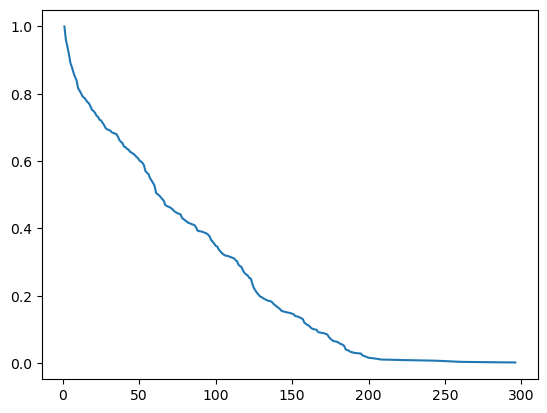

In [11]:
def compute_CCDF(data, normalize=True):
    x = np.sort(data)[::-1]
    counts = x.size - np.searchsorted(x[::-1],x[::-1],side='left') # we need searchsorted to take into account duplicated values
    if normalize:
        counts = np.true_divide(counts, counts[-1])
    return x[::-1], counts/counts.max()


Gtdeg=np.array([n for (k,n) in Gt.degree()])
Gx, GcountsCCDF = compute_CCDF(Gtdeg)
plt.plot(Gx, GcountsCCDF)



In [149]:
#degree centrality
#DegCent=nx.degree_centrality(Gt)

#Eigenvector centrality
EigCent = nx.eigenvector_centrality(G_binary)

#Betweeness centrality
BetCent = nx.betweenness_centrality(G_binary)

#Closeness centrality
ClosCent = nx.closeness_centrality(G_binary) 



In [150]:
KatzCent = nx.katz_centrality(G_binary, max_iter=2000)

PowerIterationFailedConvergence: (PowerIterationFailedConvergence(...), 'power iteration failed to converge within 2000 iterations')

In [151]:
centralites_titles=[ "Eigenvector Centrality", "Betweeness Centrality", "Closeness Centrality"]

centralities=[ EigCent, BetCent, ClosCent]

In [18]:
def min_count(colors):
    _, count = np.unique(colors, return_counts=True)
    
    return count.min()

In [19]:
#Weitghts
We, W_pos, W_neg = weights(Gt)

#extract degrees
d, d_pos, d_neg = degrees(Gt)

D= np.diag(d)

D_pos = np.diag(d_pos)
D_neg = np.diag(d_neg)

(-0.5, 567.5, 567.5, -0.5)

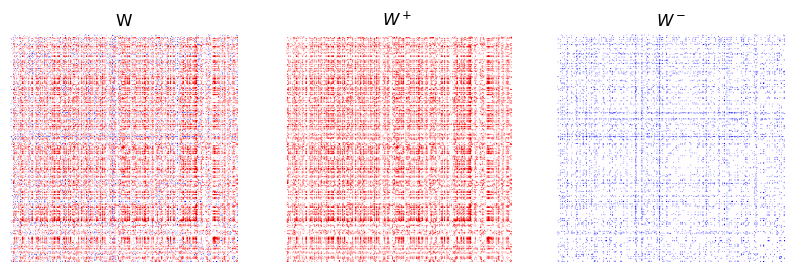

In [20]:

c = "seismic"
plt.figure(figsize=(10,8))

plt.subplot(1,3,1)
plt.imshow(We, vmin=-1, vmax=1)
plt.title("W")
plt.set_cmap(c)
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(W_pos,vmin=-1, vmax=1)
plt.title("$W^+$")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(W_neg*-1, vmin=-1, vmax=1)
plt.title("$W^-$")

plt.set_cmap(c)
plt.axis('off')

# Clusterings

In [182]:


def plot_clusters(Gt, colors, BC=True): #biggest component
    
    
    pca1=KernelPCA(n_components=3)
    pca2=KernelPCA(n_components=3)
    
    if BC:
        pca_struc=pca1.fit_transform(structure_featureBC)
        pca_offi=pca2.fit_transform(offisides_featureBC)
    else:
        pca_struc=pca1.fit_transform(structure_feature)
        pca_offi=pca2.fit_transform(offisides_feature)
  
    
    c=cmap(colors/colors.max())
        
    plt.figure(figsize=(10,8))
    plt.subplot(2,2,1)
    plt.scatter(pca_struc[:,0], pca_struc[:,1], c=c)
    plt.xlabel("1st component")
    plt.ylabel("2nd component")
    plt.title("Structure Feature reduced")
    
    plt.subplot(2,2,2)
    plt.scatter(pca_struc[:,0], pca_struc[:,2], c=c)
    plt.xlabel("1st component")
    plt.ylabel("3rd component")
    plt.title("Structure Feature reduced")



    plt.subplot(2,2,3)
    plt.scatter(pca_offi[:,0], pca_offi[:,1], c=c)
    plt.xlabel("1st component")
    plt.ylabel("2nd component")
    plt.title("Offiside Feature reduced")
    
    plt.subplot(2,2,4)
    plt.scatter(pca_offi[:,0], pca_offi[:,2], c=c)
    plt.xlabel("1st component")
    plt.ylabel("3rd component")
    plt.title("Offiside Feature reduced")
    
    plt.show()


    #pca =KernelPCA(n_components=40)
    #pca_data=pca.fit_transform(A)
    #plt.scatter(pca_data[:,0], pca_data[:,1], c=cmap(colors/colors.max()))
    #plt.title("PCA on Adjacency Matrix")
    #plt.show()
    
    return

        
def cluster_sizes(label):
    #d= np.unique(label, return_counts=True)
    #cs = {d[0][i]:d[1][i] for i in range(d[0].shape[0])}
    _, cs= np.unique(label, return_counts=True)
    
    print(cs)
    return cs 

def plot_labels(L_signed, d,d_pos, d_neg, label, set_lim=False, xlim=[-1,1], ylim=[-1,1], title=None):
    pca=KernelPCA(n_components=3)
    pca_L = pca.fit_transform(L_signed)
    
    #vmax=np.max(np.maximum(d, d_pos-d_neg))
    #vmin=np.min(np.minimum(d, d_pos-d_neg))
    
    vmaxd=np.max(d)
    vmind=np.min(d)
    vmaxdiff=np.max(d_pos-d_neg)
    vmindiff=np.min(d_pos-d_neg)
    
    dnorm = colors.Normalize(vmin=vmind, vmax=vmaxd)
    c=dnorm(d)
    d_color=cmap(c)

    cdiff= (d_pos -d_neg)
    cdiffnorm=colors.Normalize(vmin=vmindiff, vmax=vmaxdiff)
    cdiff = cdiffnorm(cdiff)
    diff_color=cmap(cdiff)
  
    fontsize=13
    title_size=15
    
    plt.figure(figsize=(15,8))

    #d_color=cmap(d/d.max())
    #diff_color= cmap(( d_pos - d_neg) /(d_pos-d_neg).max())#/(d_pos - d_neg).max()
    label_color=cmap(label/label.max())
    
    fig=plt.figure(figsize=(15,8))
    plt.subplot(2,3,1)
    plt.scatter(pca_L[:,0], pca_L[:,1], c = d_color)
    plt.xlabel("X", fontsize=fontsize)
    plt.ylabel("Y", fontsize=fontsize)
    plt.title("degree", size=title_size)
    plt.locator_params(axis='y', nbins=6)
    plt.locator_params(axis='x', nbins=6)
    
    if set_lim:
        plt.xlim(xlim)
        plt.ylim(ylim)
    
    plt.subplot(2,3,2)
    plt.title("pos-neg", size=title_size)
    plt.scatter(pca_L[:,0], pca_L[:,1], c= diff_color)
    plt.xlabel("X", fontsize=fontsize)
    plt.ylabel("Y", fontsize=fontsize)
    plt.locator_params(axis='y', nbins=6)
    plt.locator_params(axis='x', nbins=6)
    
    if set_lim:
        plt.xlim(xlim)
        plt.ylim(ylim)
        
    plt.subplot(2,3,3)
    plt.scatter(pca_L[:,0], pca_L[:,1], c = label_color)
    plt.xlabel("X", fontsize=fontsize)
    plt.ylabel("Y", fontsize=fontsize)
    plt.title("label", size=title_size)
    plt.locator_params(axis='y', nbins=6)
    plt.locator_params(axis='x', nbins=6)
    if set_lim:
        plt.xlim(xlim)
        plt.ylim(ylim)
        
    plt.subplot(2,3,4)
    plt.scatter(pca_L[:,0], pca_L[:,2], c = d_color)
    plt.title("degree", size=title_size)
    plt.xlabel("X", fontsize=fontsize)
    plt.ylabel("Z", fontsize=fontsize)
    plt.locator_params(axis='y', nbins=6)
    plt.locator_params(axis='x', nbins=6)
    if set_lim:
        plt.xlim(xlim)
        plt.ylim(ylim)
    
    plt.subplot(2,3,5)
    plt.scatter(pca_L[:,0], pca_L[:,2], c= diff_color)
    plt.title("pos-neg", size=title_size)
    plt.xlabel("X", fontsize=fontsize)
    plt.ylabel("Z", fontsize=fontsize)
    plt.locator_params(axis='y', nbins=6)
    plt.locator_params(axis='x', nbins=6)
    if set_lim:
        plt.xlim(xlim)
        plt.ylim(ylim)
        
    plt.subplot(2,3,6)
    plt.scatter(pca_L[:,0], pca_L[:,2], c = label_color)
    plt.xlabel("X", fontsize=fontsize)
    plt.ylabel("Z", fontsize=fontsize)
    plt.title("label", size=title_size)
    plt.locator_params(axis='y', nbins=6)
    plt.locator_params(axis='x', nbins=6)
    if set_lim:
        plt.xlim(xlim)
        plt.ylim(ylim)
    
    #plt.autoscale(enable=True, axis='both', tight=None)
    plt.tight_layout()
    
    if (title!=None) & (saveimage==True):
        plt.savefig("./plots/"+title+".png")
    return fig

#######################################################################################333
def plot_centralities(L_signed, centralites, titles, set_lim=False, xlim=[-1,1], ylim=[-1,1]):
    pca=KernelPCA(n_components=3)
    pca_L = pca.fit_transform(L_signed)
    
    
    for i,c in enumerate(centralities):
        
        col= np.asarray(list(c.values()))
        vmin=col.min()
        vmax=col.max()
        
        norm = colors.Normalize(vmin=vmin, vmax=vmax)
        col=cmap(norm(col))
        
        fig=plt.figure(figsize=(10,5))
        
        plt.suptitle(titles[i])
        plt.subplot(1,2,1)
        plt.scatter(pca_L[:,0], pca_L[:,1], c = col)
        plt.xlabel("1st component")
        plt.ylabel("2nd component")
        
        if set_lim:
            plt.xlim(xlim)
            plt.ylim(ylim)

        plt.subplot(1,2,2)
        plt.scatter(pca_L[:,0], pca_L[:,2], c= col)
        plt.xlabel("1st component")
        plt.ylabel("3rd component")
        
        if set_lim:
            plt.xlim(xlim)
            plt.ylim(ylim)

    plt.autoscale(enable=True, axis='both', tight=None)
    
    return



###################################################################################



def draw_communities(label):
    values, count = np.unique(label, return_counts=True)
    c_sum=0
    for c in count:
        c_sum += c
        plt.axvline(x=c_sum, c="black")
        plt.axhline(y=c_sum, c = "black")
        
    return


def Weight_plots(W, W_pos, W_neg, label, title=None):
    idx=np.argsort(label)
    
    W=W[idx,:]
    W=W[:, idx]
    
    W_pos=W_pos[idx,:]
    W_pos=W_pos[:,idx]
    
    W_neg=W_neg[idx,:]
    W_neg=W_neg[:,idx]
    
    c = "seismic"
    plt.figure(figsize=(12,8))

    plt.subplot(1,3,1)
    plt.imshow(W, vmin=-1, vmax=1)
    draw_communities(label)
    plt.title("W")
    plt.axis('off')

    plt.subplot(1,3,2)
    plt.imshow(W_pos, vmin=-1, vmax=1)
    plt.title("$W^+$")
    plt.axis('off')

    plt.subplot(1,3,3)
    plt.imshow(W_neg*-1, vmin=-1, vmax=1)
    plt.title("$W^-$")

    plt.set_cmap(c)
    plt.axis('off')
    
    plt.tight_layout()
    if (title != None) &(saveimage==True):
        plt.savefig("./plots/"+title+".png")
    
    return

In [22]:
k=6
saveimage=False

## Spectral Clustering

unsigned Laplacian Matrix
$ L = D-A $

In [19]:
L_signed=D-A

In [20]:
label_signed = spectral_clustering(L_signed, 10)

In [21]:
#plot_clusters(Gt, label_signed, BC)

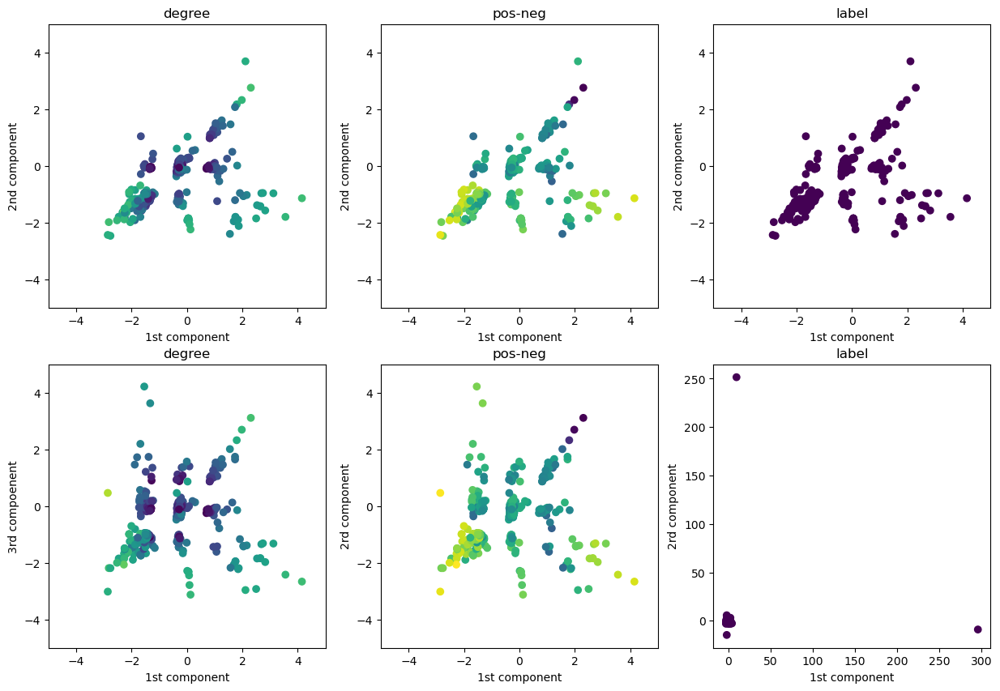

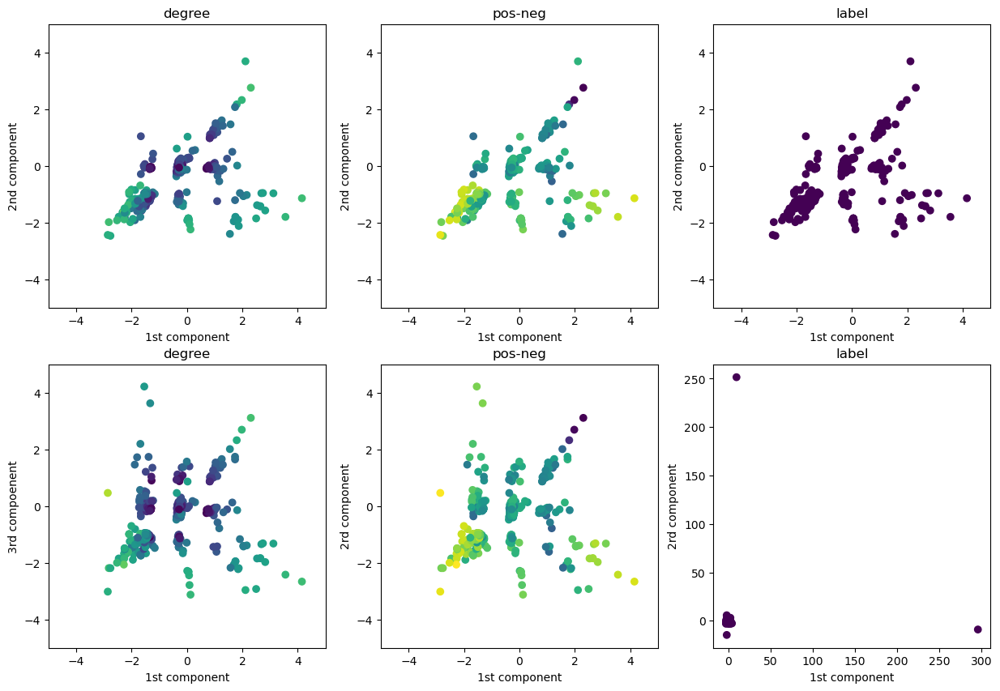

In [22]:
plot_labels(L_signed, d,d_pos, d_neg, label_signed, True, [-5,5], [-5, 5])

In [23]:
#CBI(Gt, colors)

In [24]:
min_count(label_signed)

NameError: name 'min_count' is not defined

## Laplacians on Signed Graphs

Balance Ratio
$$ L_{BR} = D^+ - W^+ + W^-$$

Normalized Laplacian
$$ L_{BN} = \bar{D}L_{BR}$$

Signed Ratio 
$$ L_{SR}= \bar{D} - W^+ + W^-$$

Normalized Laplacian
$$ L_{SN} = \bar{D}^{-1/2}L_{SR}\bar{D}^{-1/2} $$

Arithmetic mean Laplacian
 $$ L_{AM} = L^+_{sym} + Q^-_{sym}$$
 
 Geometric Mean Laplacian
$$ L_{GM} = L^+_{sym}\#Q^-_{sym}$$

In [174]:

k=6
saveimage=True

L_BR = build_L_BR(W_pos, W_neg)
label_BR = spectral_clustering(L_BR, k)

L_BN = build_L_BN(W_pos, W_neg)
label_BN = spectral_clustering(L_BN, k)

L_SR = build_L_SR(W_pos, W_neg)
label_SR = spectral_clustering(L_SR, k) #2

L_SN=build_L_SN(W_pos, W_neg)#np.diag(np.array(d_all)**(-0.5)) @L_SR @ np.diag(np.array(d_all)**(-0.5))
#L_SN = np.diag(d**(-0.5)) @L_SR @ np.diag(d**(-0.5))
label_SN = spectral_clustering(L_SN,k)

L_AM = build_L_AM(W_pos, W_neg)
label_AM = spectral_clustering(L_AM, k)

L_GM = build_L_GM(W_pos, W_neg)
label_GM = spectral_clustering(L_GM,k)


H,W=load_matrix(k)
label_H=np.argmax(H, axis=0)

C:\Users\sujen\Documents\HS22_Programme\HS2022_MAT933_Project\Code\Laplacians.py:110: ComplexWarning: Casting complex values to real discards the imaginary part
  A_negsqrt[non_zero]= 1/np.sqrt(A[non_zero])


In [154]:
print("BR")
BR_cs=cluster_sizes(label_BR)
print("BN")
BN_cs=cluster_sizes(label_BN)
print("SR")
SR_cs=cluster_sizes(label_SR)
print("SN")
SN_cs=cluster_sizes(label_SN)
print("AM")
AM_cs = cluster_sizes(label_AM)
print("GM")
GM_cs = cluster_sizes(label_GM)
print("semi-NMF")
H_cs = cluster_sizes(label_H)



BR
[544   4   9   2   1   8]
BN
[522   9   2   4   1  30]
SR
[551  10   2   1   3   1]
SN
[ 48 246 148 121   1   4]
AM
[548   1   3   4   1  11]
GM
[271  33  56  97  36  75]
semi-NMF
[ 89 171 111  88  51  58]


### BR

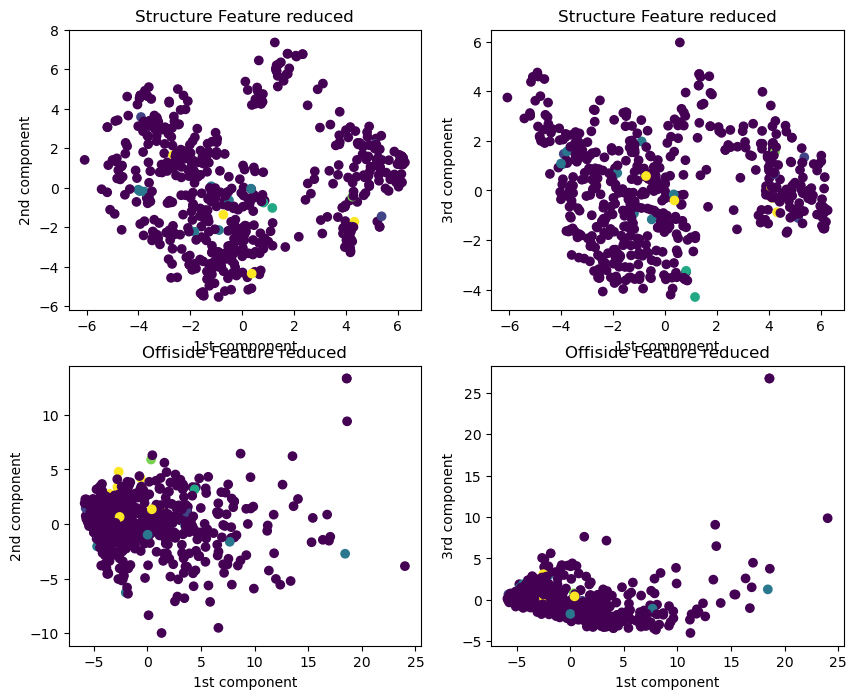

In [155]:
plot_clusters(Gt, label_BR, BC)

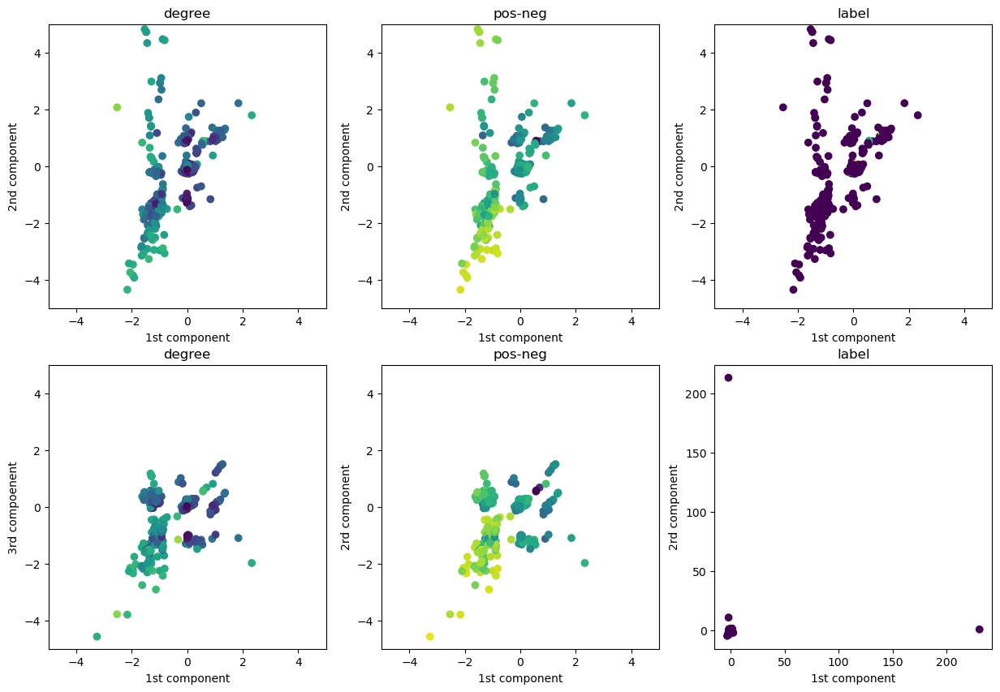

In [156]:
f=plot_labels(L_BR, d,d_pos, d_neg, label_BR, True, [-5,5], [-5, 5])

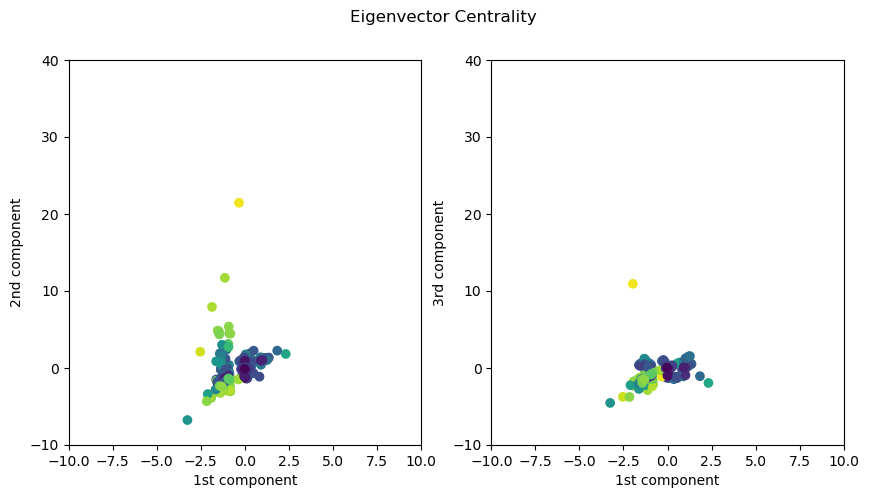

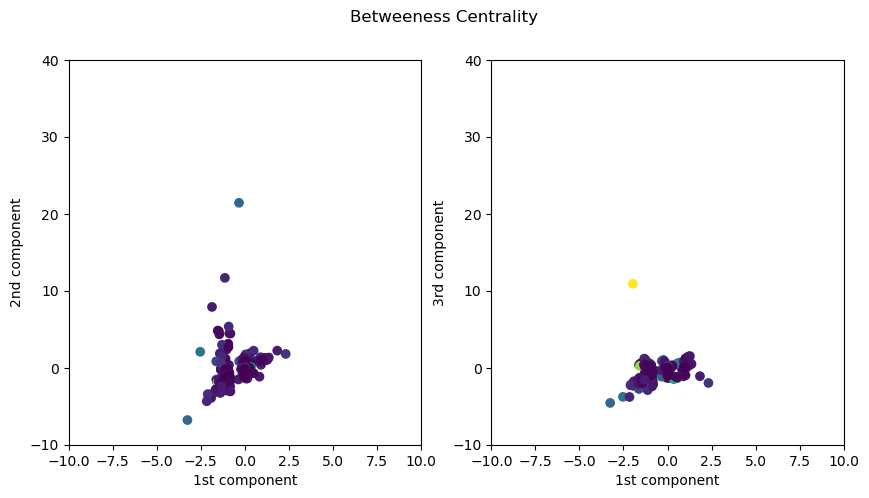

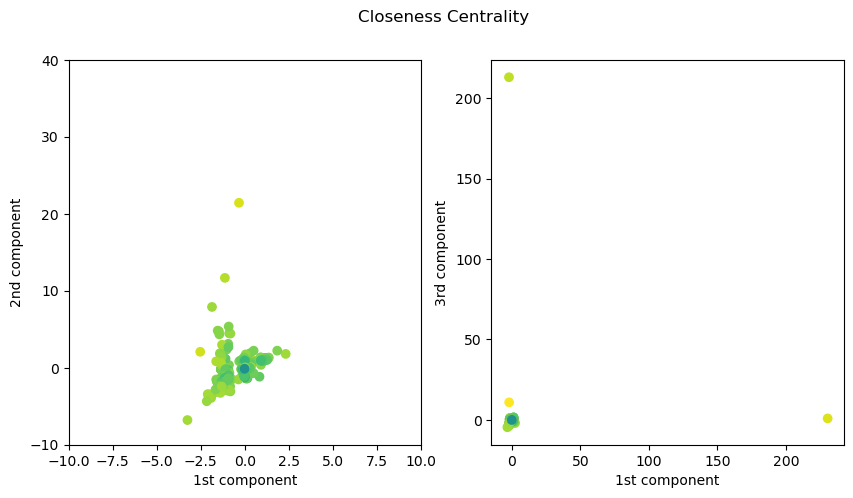

In [157]:
plot_centralities(L_BR, centralities, centralites_titles, set_lim=True, xlim=[-10,10], ylim=[-10,40])

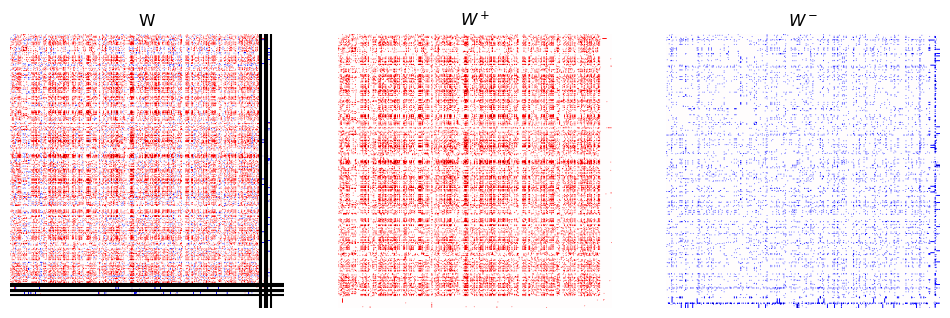

In [158]:
Weight_plots(We, W_pos, W_neg, label_BR)

In [200]:
start=time.time()
cbi_BR=CBI(Gt,label_BR)
print("time: {} s".format(time.time() -start))
print("cbi BR: {}".format(cbi_BR))

unbalanced triangels: 46177 , 9.95586621447683%
weakly balanced: 4965, 1.0704652912678922%
strongly balanced: 412675, 88.97366849425528%
total triangles: 463817
time: 616.575541973114 s
cbi BR: 86.23945207627573


### BN

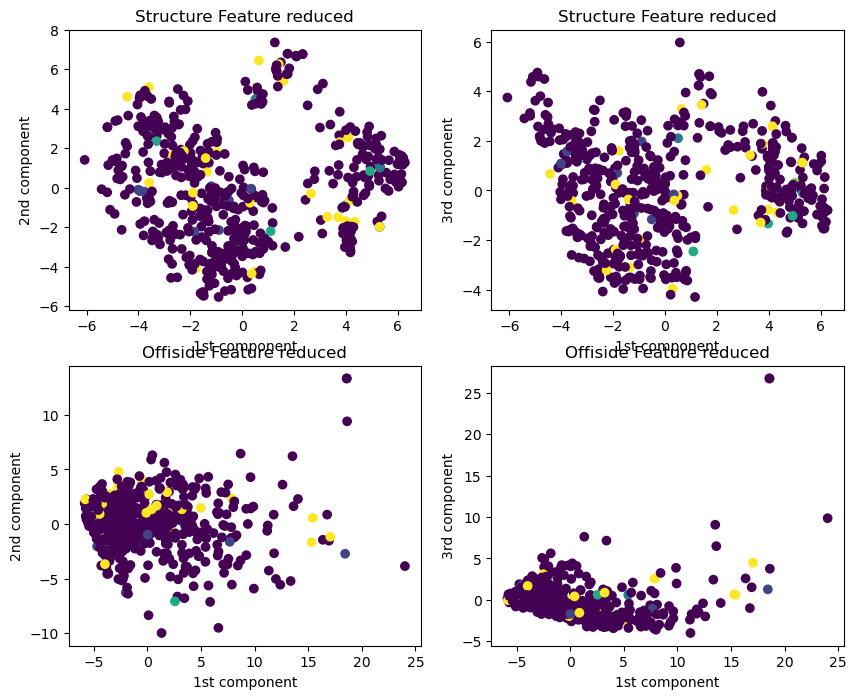

In [159]:
plot_clusters(Gt,label_BN, BC)

<Figure size 1500x800 with 0 Axes>

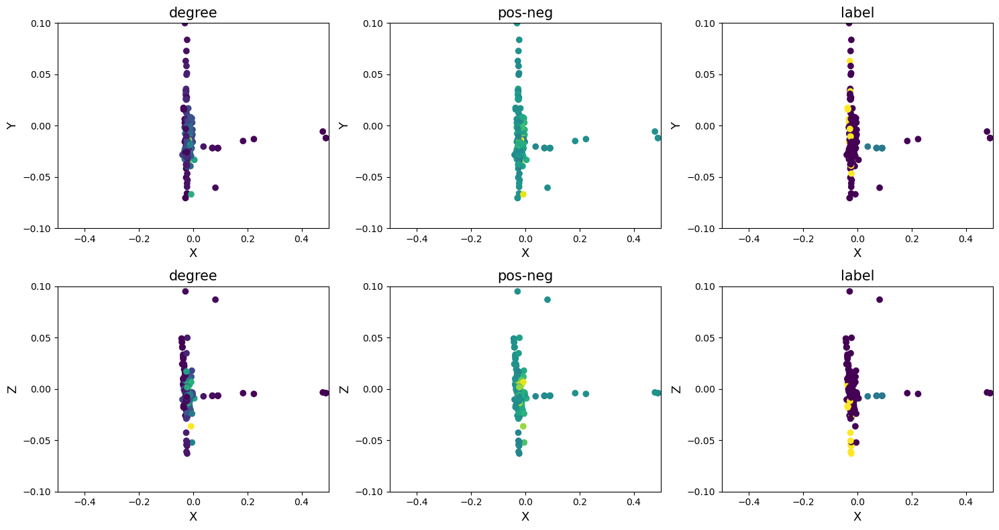

In [183]:
f=plot_labels(L_BN, d,d_pos, d_neg, label_BN, True, [-0.5,0.5], [-0.1, 0.1], title="L_BN_degrees")

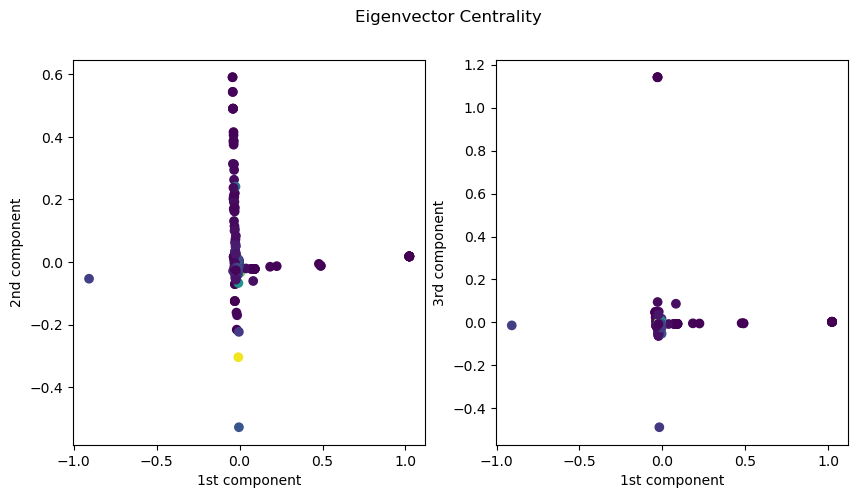

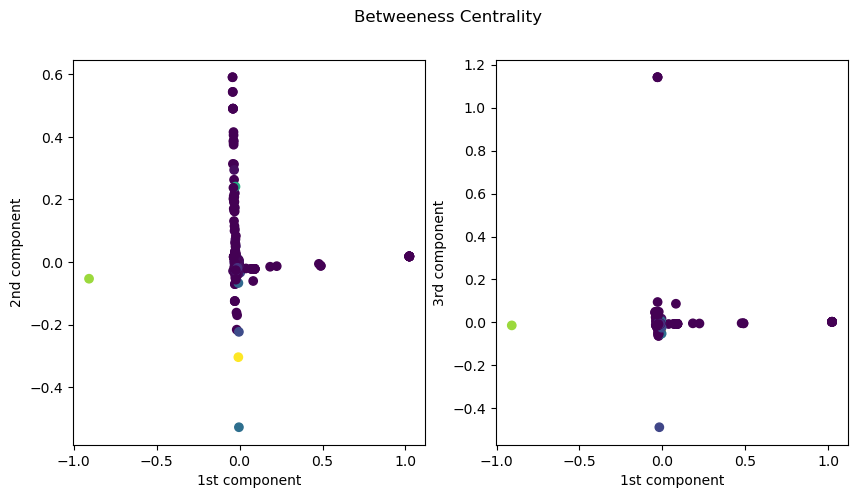

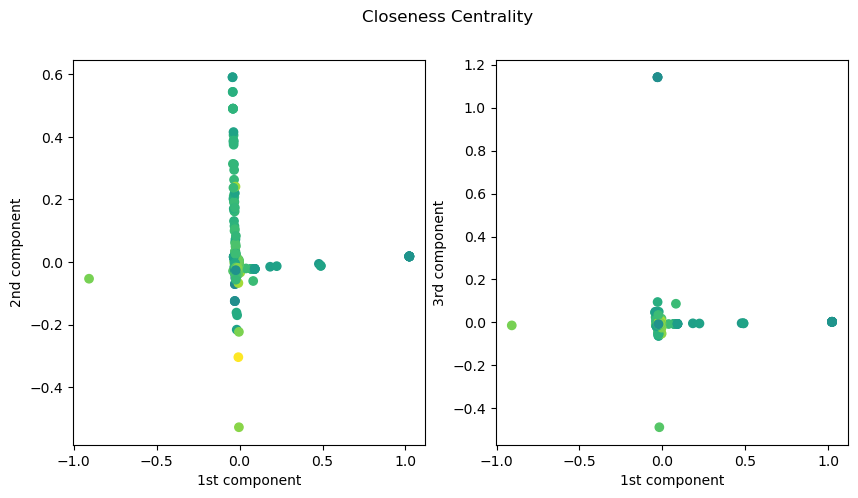

In [161]:
plot_centralities(L_BN , centralities, centralites_titles, set_lim=False, xlim=[-10,10], ylim=[-10,40])

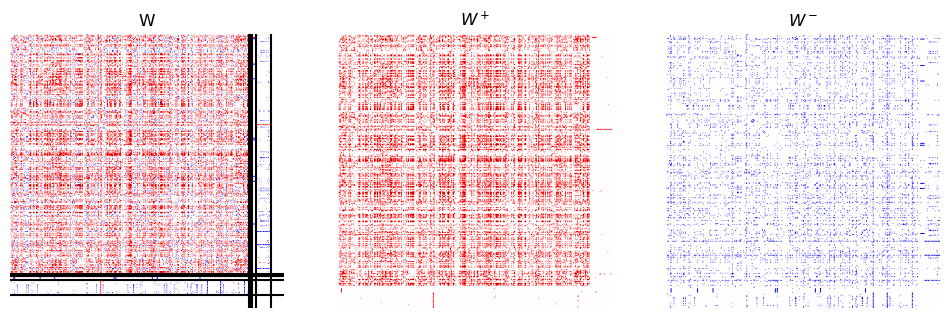

In [103]:
Weight_plots(We, W_pos, W_neg, label_BN)

In [ ]:
start=time.time()
cbi_BN=CBI(Gt,label_BN)
print("time: {} s".format(time.time() -start))
print("cbi BN: {}".format(cbi_BN))

### SR

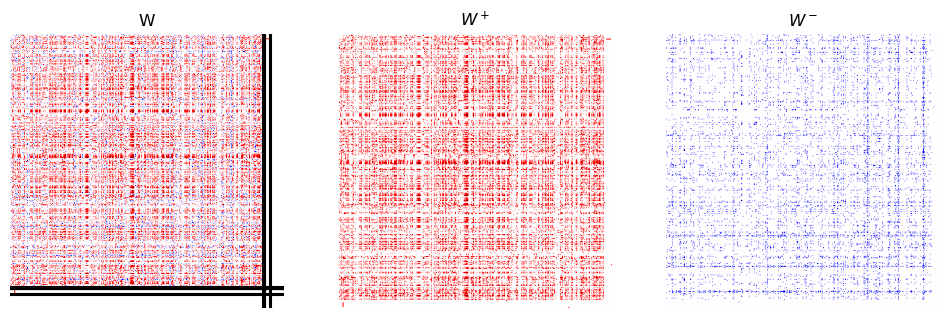

In [104]:
Weight_plots(We, W_pos, W_neg, label_SR)

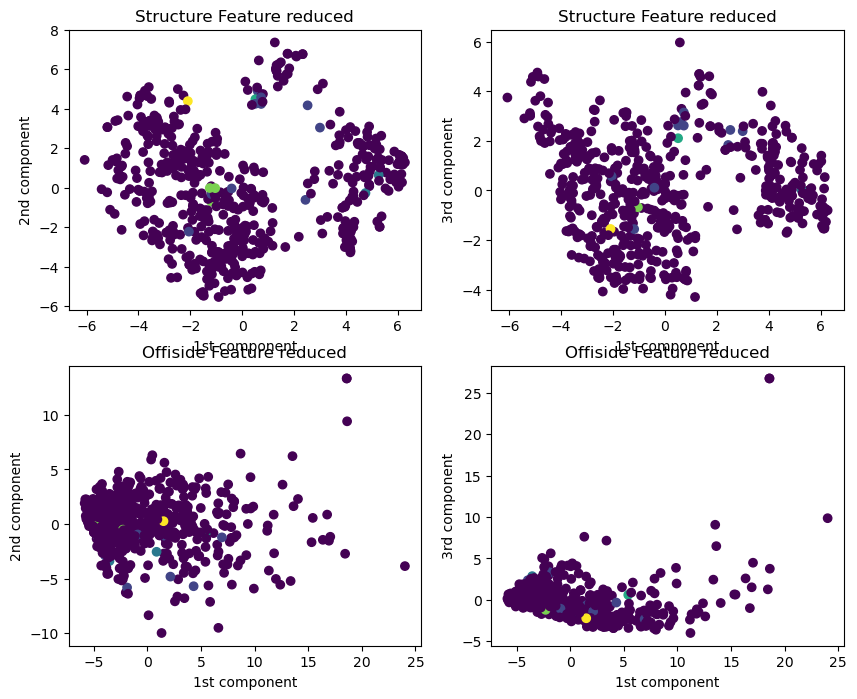

In [162]:
plot_clusters(Gt, label_SR, BC)
    

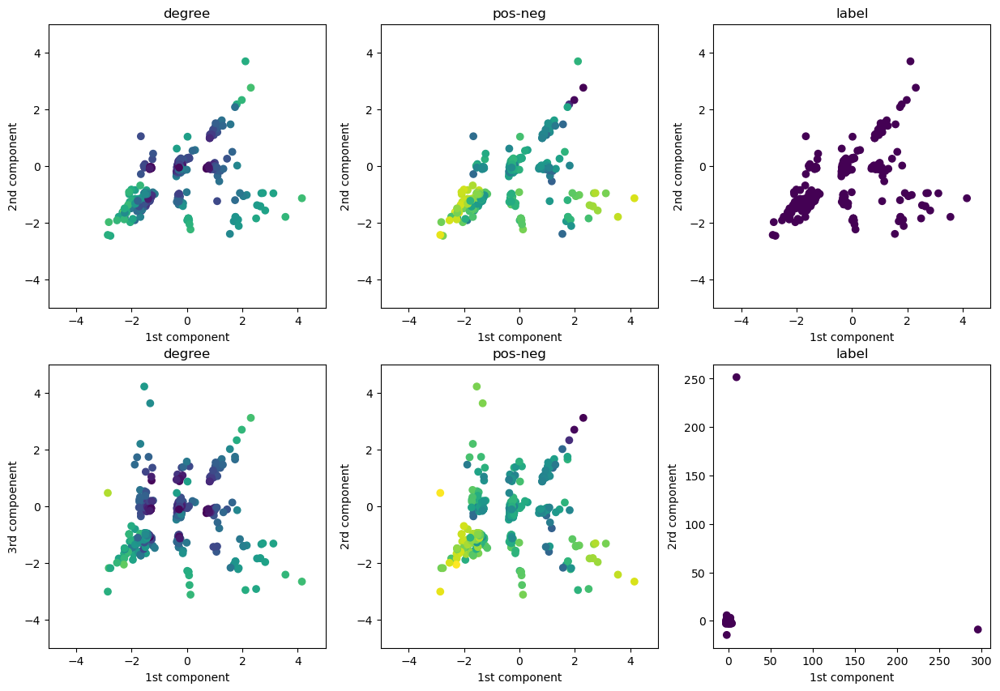

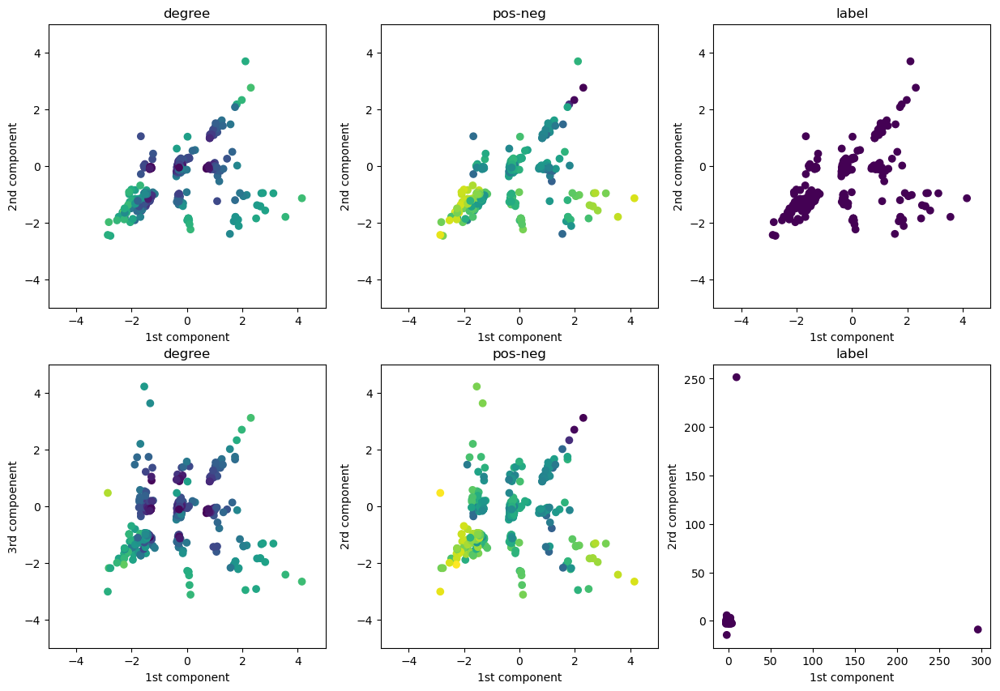

In [163]:
plot_labels(L_SR, d,d_pos, d_neg, label_SR, True, [-5,5], [-5, 5])

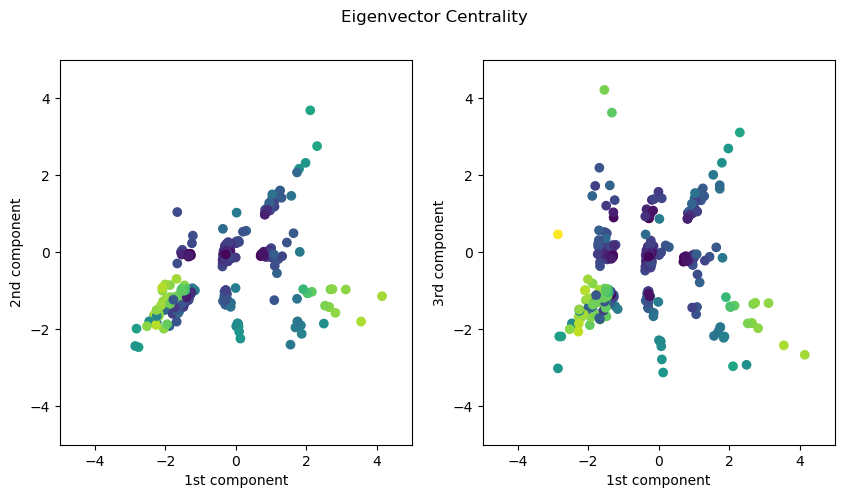

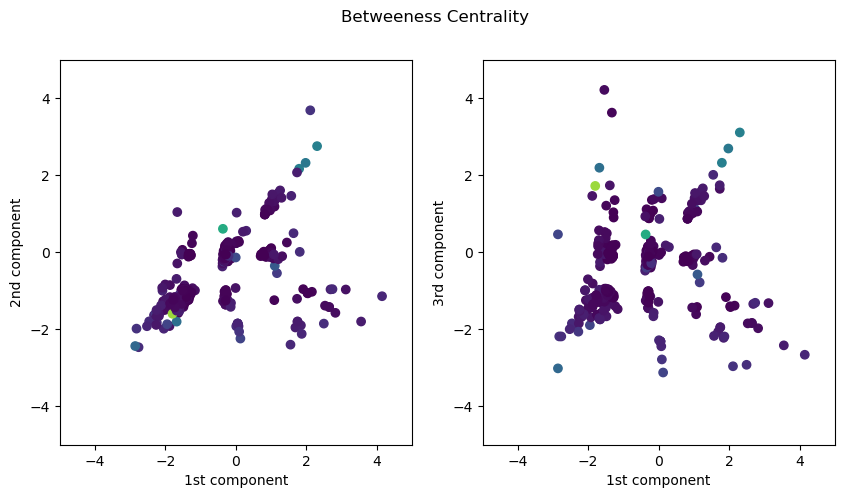

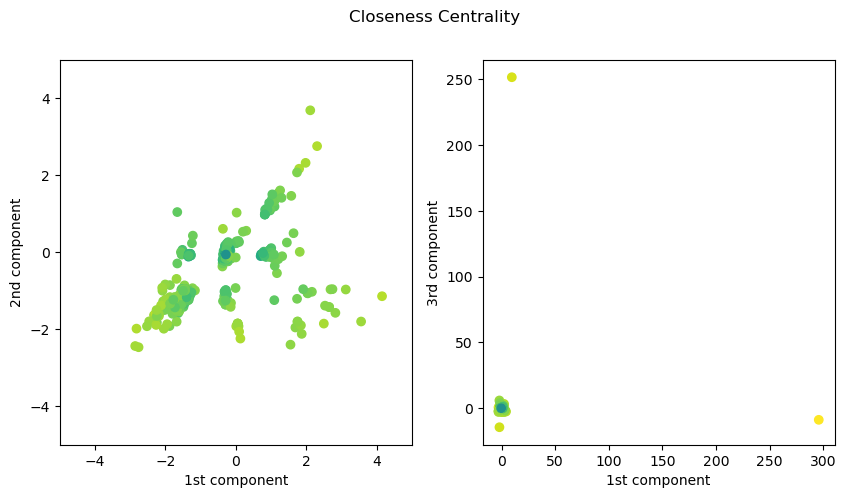

In [164]:
plot_centralities(L_SR, centralities, centralites_titles, True, [-5,5], [-5, 5])

In [ ]:
start=time.time()
cbi_SR=CBI(Gt,label_SR)
print("time: {} s".format(time.time() -start))
print("cbi SR: {}".format(cbi_SR))

### SN

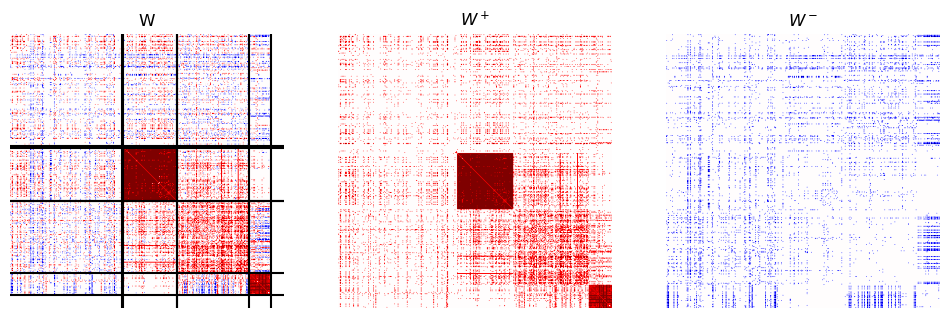

In [108]:
Weight_plots(We, W_pos, W_neg, label_SN)#, "L_SN_Weights")

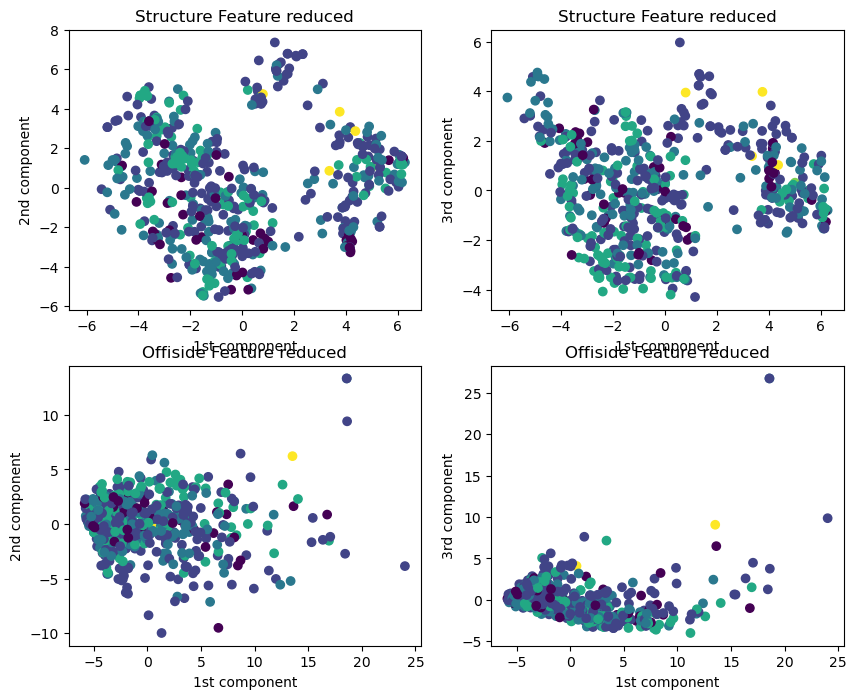

In [165]:
plot_clusters(Gt, label_SN, BC)

<Figure size 1500x800 with 0 Axes>

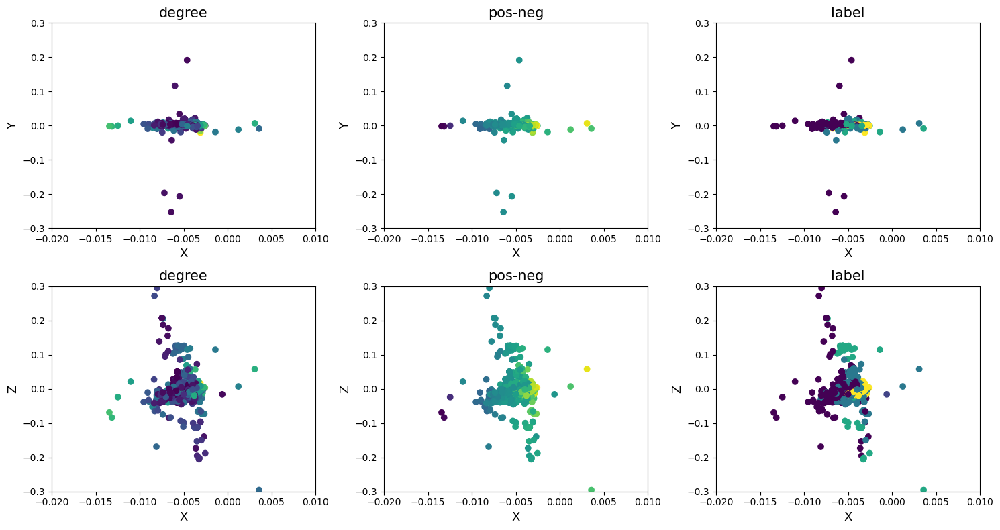

In [191]:
f=plot_labels(L_SN, d,d_pos, d_neg, label_SN, True, [-0.02,0.01], [-0.3, 0.3], "L_SN_degrees_Zoom")

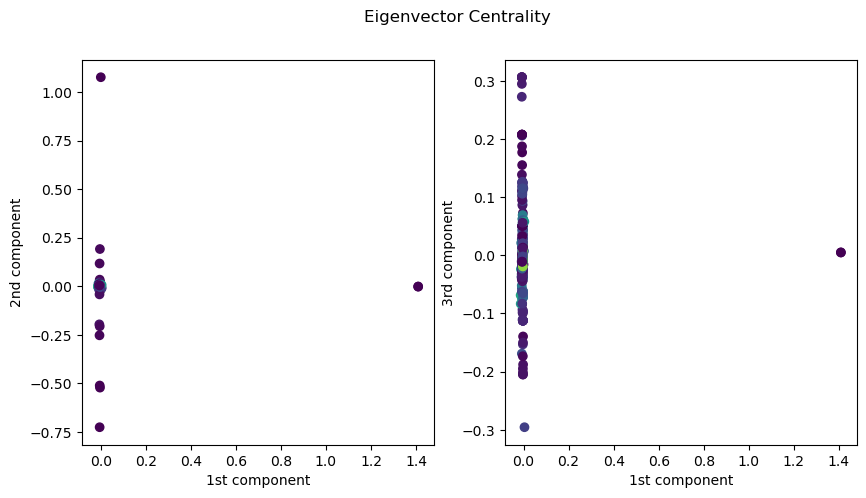

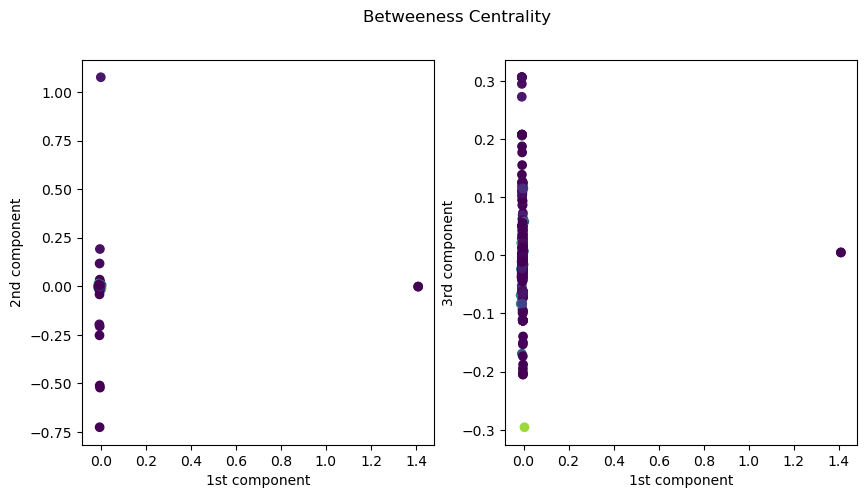

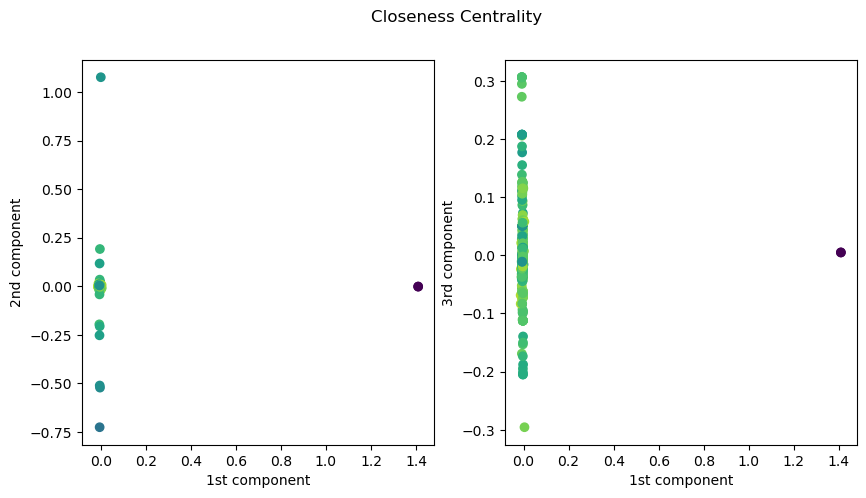

In [167]:
plot_centralities(L_SN, centralities, centralites_titles, False, [-5,5], [-5, 5])

In [ ]:
start=time.time()
cbi_SN=CBI(Gt,label_SN)
print("time: {} s".format(time.time() -start))
print("cbi SN: {}".format(cbi_SN))

### Arithmetic Mean Laplacian

In [56]:

""" 
L_plus = D_pos-W_pos
#Problem d_pos contains 0.
non_zero=(d_pos>0)
d_pos2=d_pos
d_pos2[non_zero]=d_pos[non_zero]**(-0.5)
L_plus_sym= np.diag(np.array(d_pos2))@L_plus@ np.diag(np.array(d_pos2))
L_plus_sym = np.asarray(L_plus_sym)

Q_minus= D_neg + W_neg
non_zero=(d_neg>0)
d_neg2=d_neg
d_neg2[non_zero]=d_neg[non_zero]**(-0.5)
Q_minus_sym = np.diag(np.array(d_neg2))@Q_minus@ np.diag(np.array(d_neg2))
Q_minus_sym = np.asarray(Q_minus_sym)
"""

' \nL_plus = D_pos-W_pos\n#Problem d_pos contains 0.\nnon_zero=(d_pos>0)\nd_pos2=d_pos\nd_pos2[non_zero]=d_pos[non_zero]**(-0.5)\nL_plus_sym= np.diag(np.array(d_pos2))@L_plus@ np.diag(np.array(d_pos2))\nL_plus_sym = np.asarray(L_plus_sym)\n\nQ_minus= D_neg + W_neg\nnon_zero=(d_neg>0)\nd_neg2=d_neg\nd_neg2[non_zero]=d_neg[non_zero]**(-0.5)\nQ_minus_sym = np.diag(np.array(d_neg2))@Q_minus@ np.diag(np.array(d_neg2))\nQ_minus_sym = np.asarray(Q_minus_sym)\n'

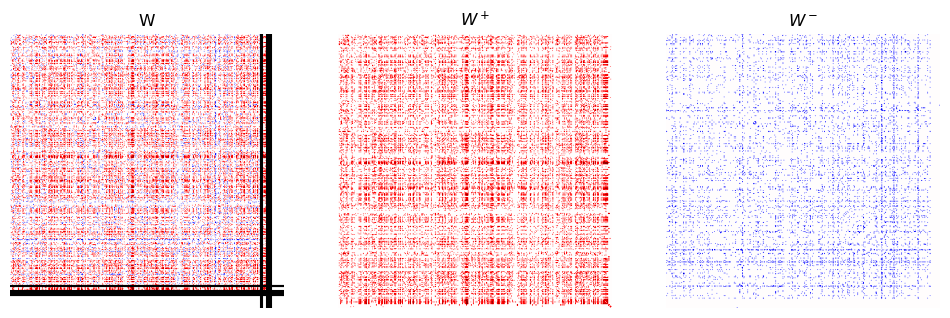

In [112]:
Weight_plots(We, W_pos, W_neg, label_AM)

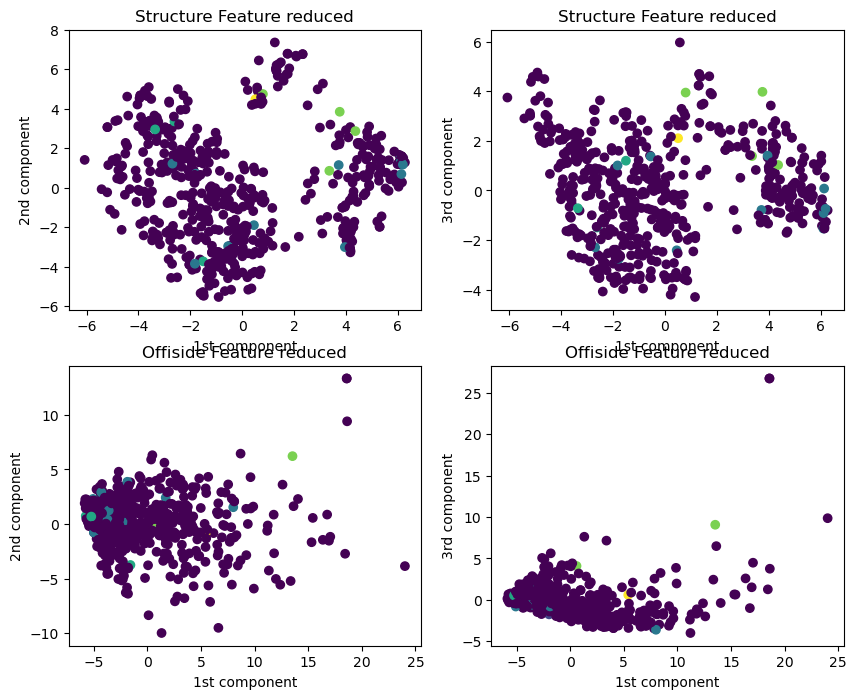

In [113]:
plot_clusters(Gt, label_AM, BC)

<Figure size 1500x800 with 0 Axes>

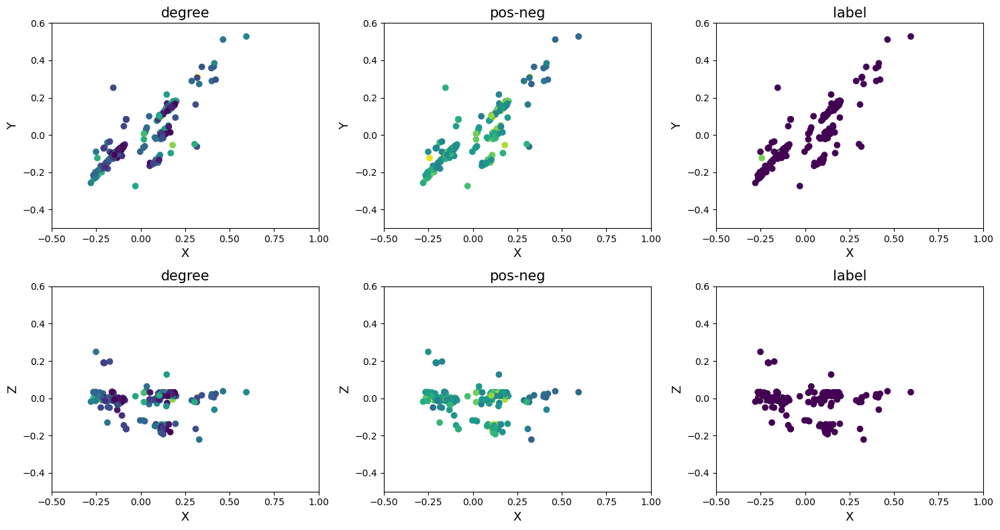

In [193]:
f=plot_labels(L_AM, d,d_pos, d_neg, label_AM, True, [-0.5,1.0], [-0.5, 0.6], "L_AM_degrees_Zoom") #default value

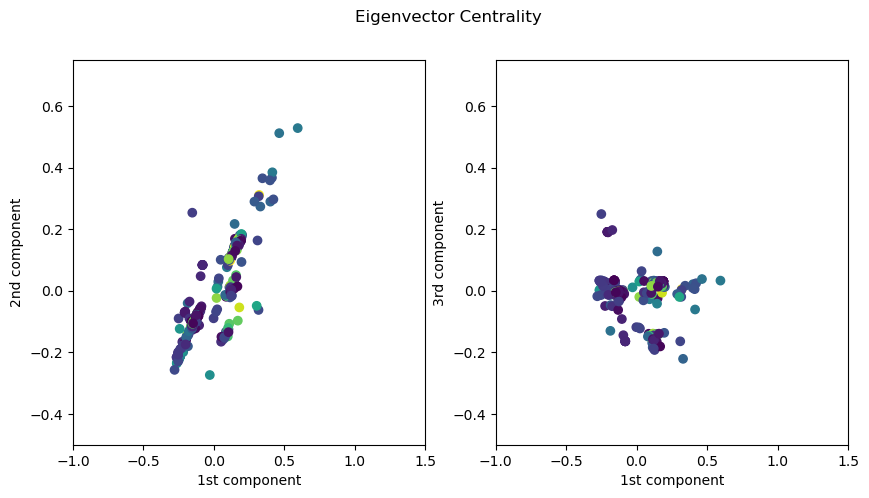

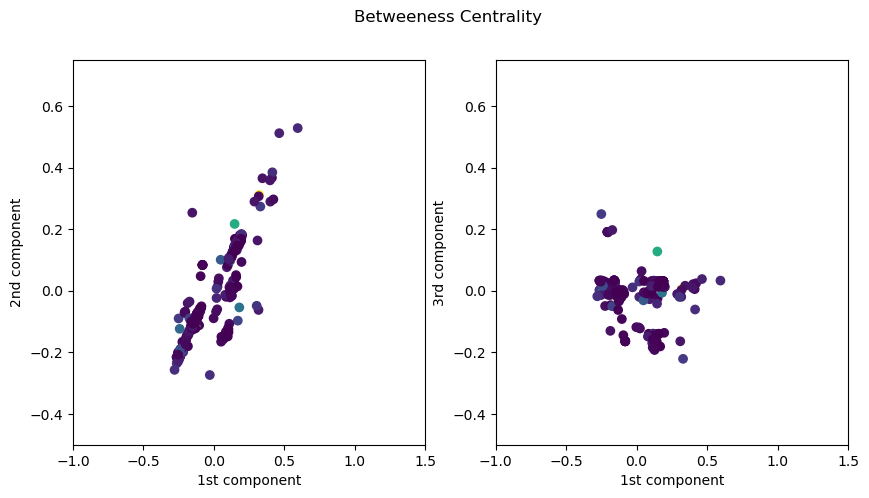

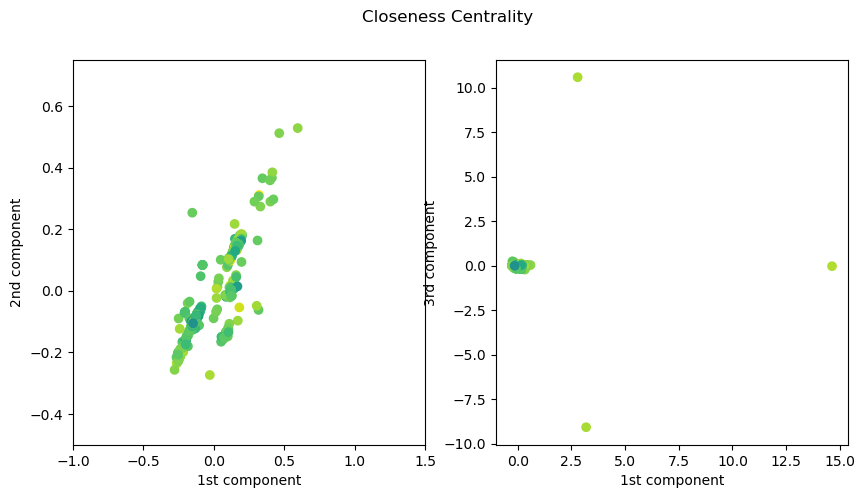

In [115]:
plot_centralities(L_AM, centralities, centralites_titles,True, [-1,1.5], [-0.5, 0.75])

In [ ]:
start=time.time()
cbi_AM=CBI(Gt,label_AM)
print("time: {} s".format(time.time() -start))
print("cbi AM: {}".format(cbi_AM))

### Geometric Mean of Laplacian

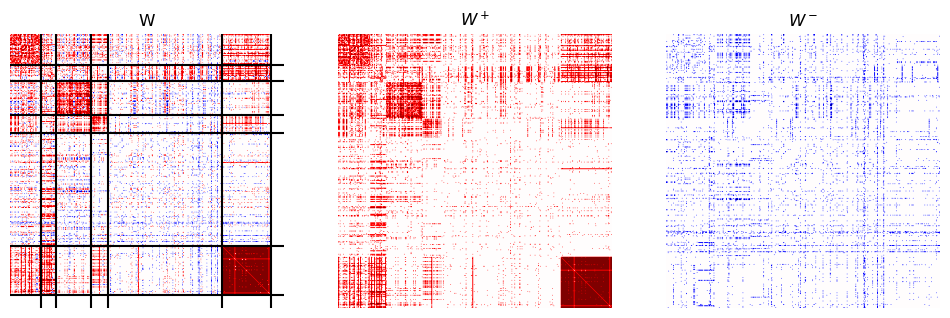

In [116]:
Weight_plots(We, W_pos, W_neg, label_GM, "L_GM_Weights")

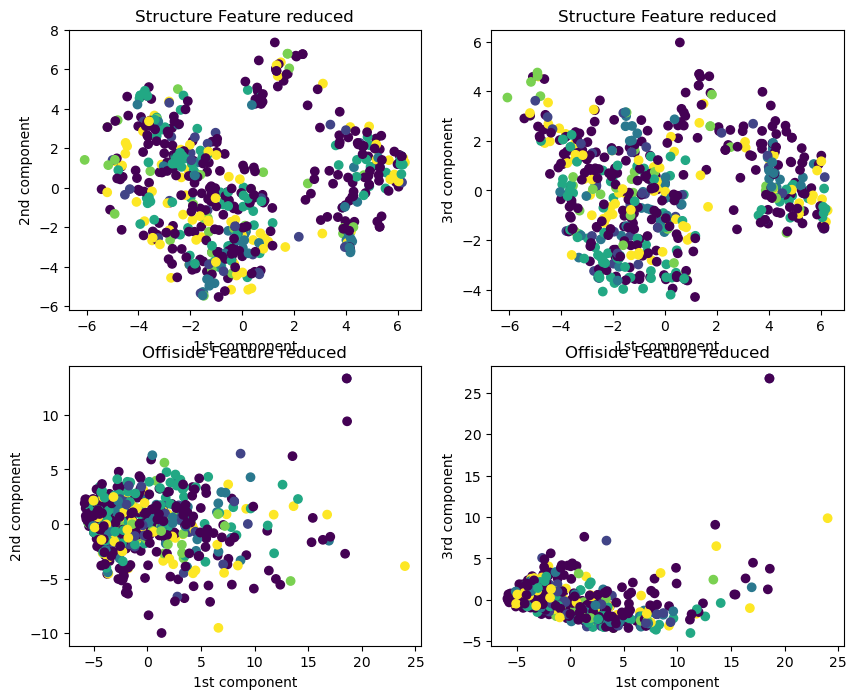

In [169]:
plot_clusters(Gt, label_GM, BC)

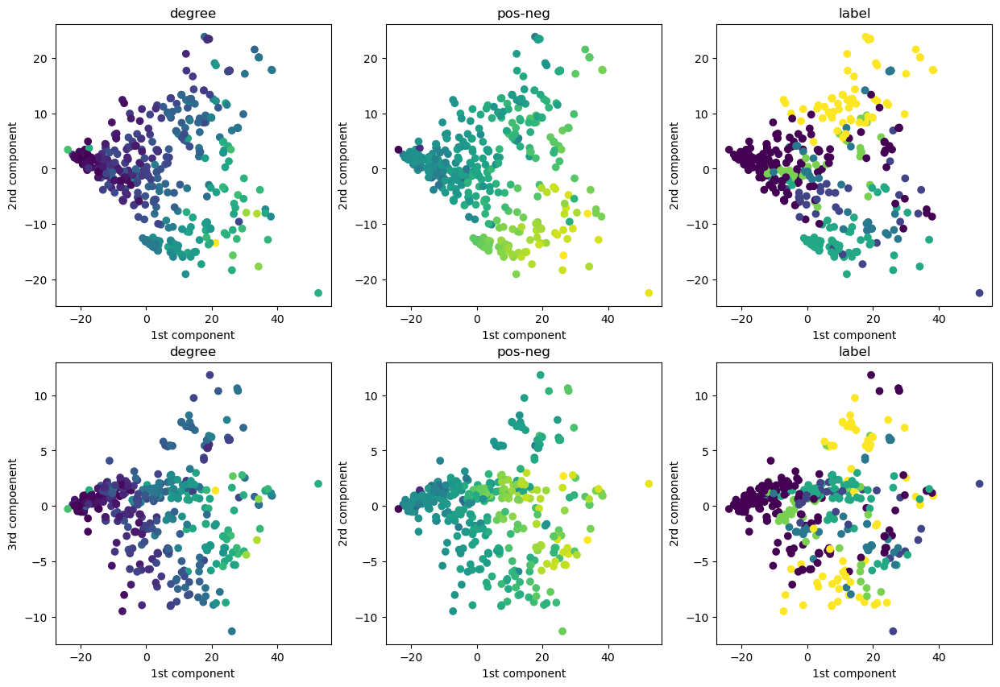

In [170]:
f=plot_labels(L_GM, d,d_pos, d_neg, label_GM, False, [-1,1.5], [-0.5, 1.0], "L_GM_degrees") #default value

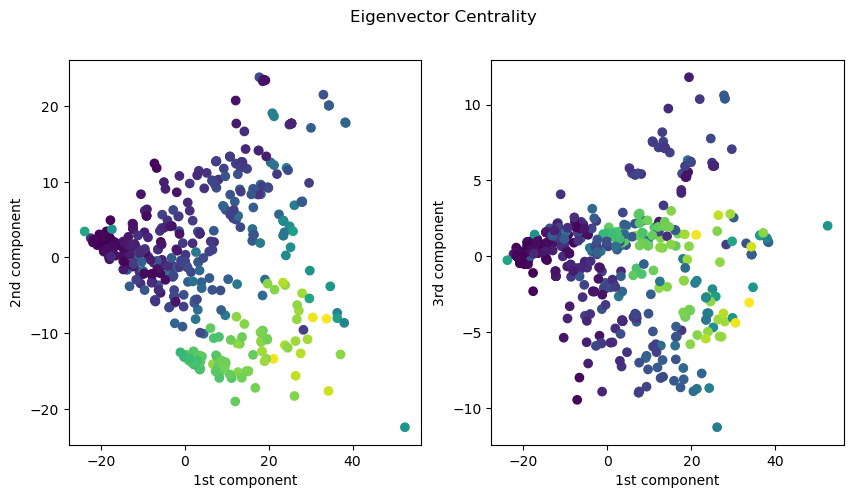

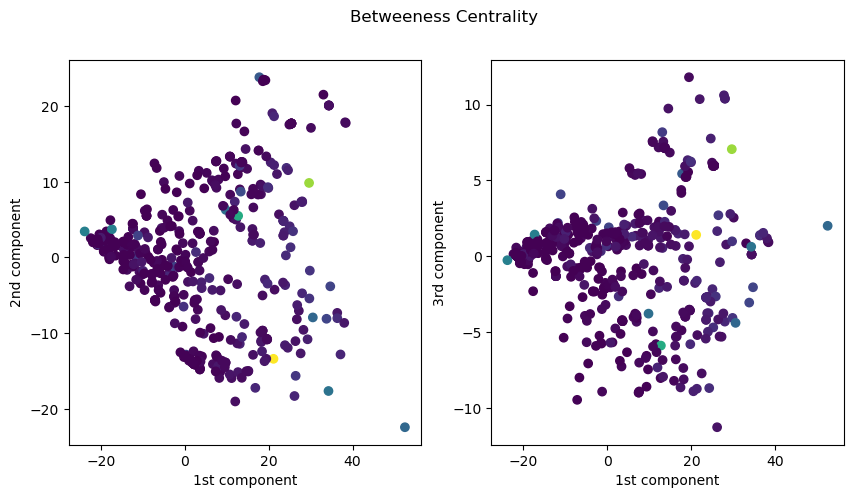

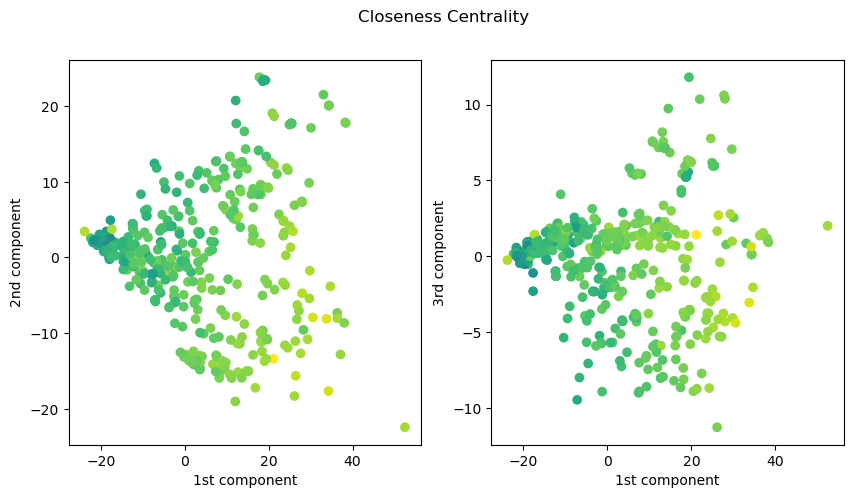

In [171]:
plot_centralities(L_GM, centralities, centralites_titles, False, [-5,5], [-5, 5])

In [74]:
start=time.time()
cbi_GM=CBI(Gt,label_GM)
print("time: {} s".format(time.time() -start))
print("cbi GM: {}".format(cbi_GM))

unbalanced triangels: 9020 , 3.9595789325818034%
weakly balanced: 749, 0.32879430382525177%
strongly balanced: 218033, 95.71162676359295%
total triangles: 227802
time: 27.549134254455566 s
cbi GM: 86.63122819578518


## semi-NMF

In [58]:
#H,W=load_matrix(k)
#label_H=np.argmax(H, axis=0)
dG,  dG_pos, dG_neg = degrees(G)

In [120]:

_, count = np.unique(label_H, return_counts=True)
count

array([ 89, 171, 111,  88,  51,  58], dtype=int64)

In [121]:
if BC==True:
    label_H=label_H[filters]

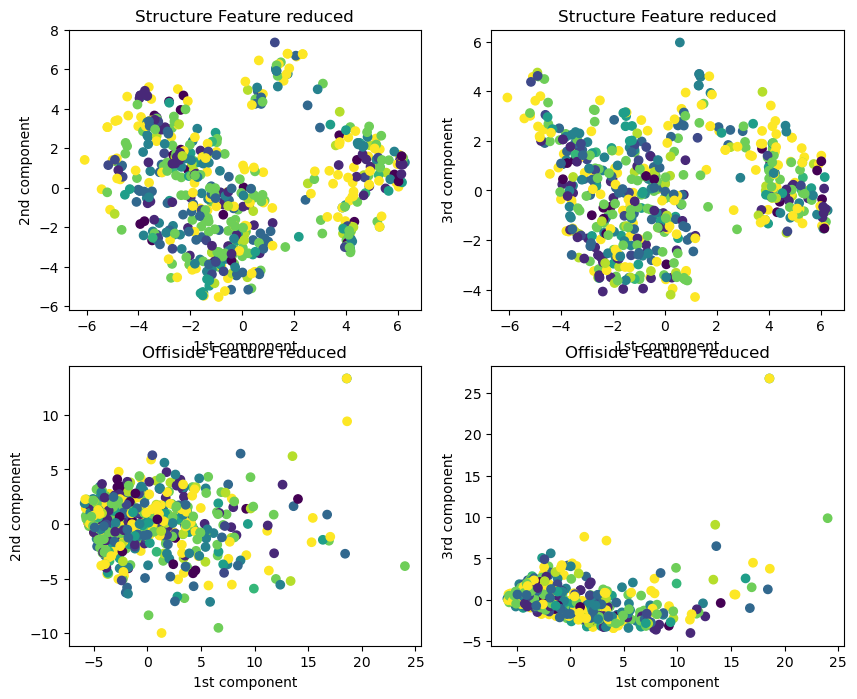

In [62]:
plot_clusters(Gt, label_H, BC)

In [93]:
start=time.time()
cbi_H=CBI(Gt,label_H)
print("time: {} s".format(time.time() -start))
print("cbi H: {}".format(cbi_H))

unbalanced triangels: 2871 , 5.2479572997971005%
weakly balanced: 2596, 4.745279397517685%
strongly balanced: 49240, 90.00676330268521%
total triangles: 54707
time: 5.099563360214233 s
cbi H: 93.38219218144901


In [195]:
pca = KernelPCA(n_components=3)
pca_W=pca.fit_transform(W)

pca = KernelPCA(n_components=3)
pca_H=pca.fit_transform(H.T)

In [124]:
#plot_labels(H, d,d_pos, d_neg, label_H, False, [-1,1.5], [-0.5, 1.0]) #default value

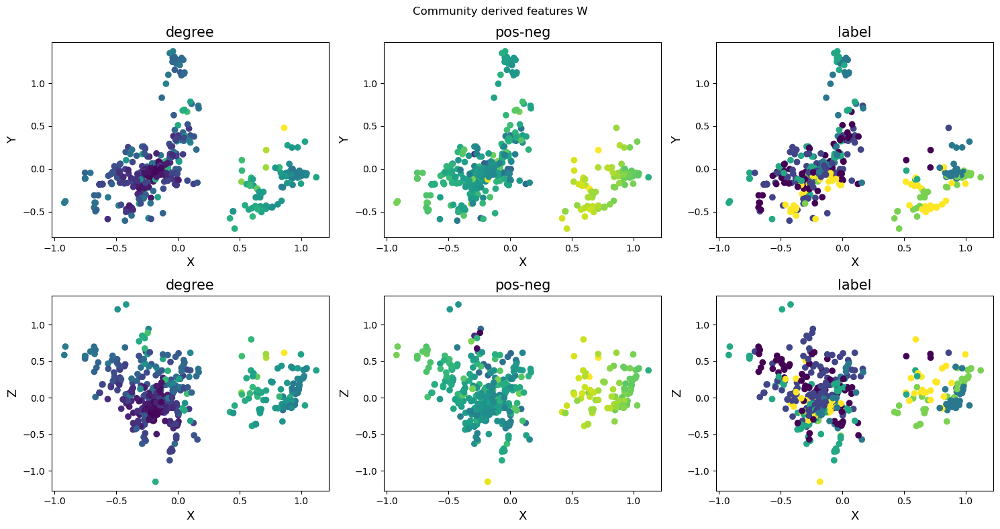

In [197]:
dGnorm = colors.Normalize(vmin=dG.min(), vmax=dG.max())
c=dGnorm(dG)

cdiff= (dG_pos -dG_neg)
cdiffnorm=colors.Normalize(vmin=cdiff.min(), vmax=cdiff.max())
cdiff = cdiffnorm(cdiff)
c_labels=label_H/label_H.max()
rows = 2
cols = 3
nbins=6
fontsize=13
title_size=15
plt.figure(figsize=(15,8))

plt.suptitle("Community derived features W")


plt.subplot(rows,cols ,1)
plt.scatter(pca_W[:,0], pca_W[:,1], c=cmap(c))
plt.xlabel("X", fontsize=fontsize)
plt.ylabel("Y" ,fontsize=fontsize)
plt.title("degree", size=title_size)
plt.locator_params(axis='y', nbins=nbins)
plt.locator_params(axis='x', nbins=nbins)

plt.subplot(rows,cols,2)
plt.scatter(pca_W[:,0], pca_W[:,1], c=cmap(cdiff))
plt.title("pos-neg", size=title_size)
plt.xlabel("X",fontsize=fontsize)
plt.ylabel("Y",fontsize=fontsize)
plt.locator_params(axis='y', nbins=nbins)
plt.locator_params(axis='x', nbins=nbins)




plt.subplot(rows,cols,3)
plt.scatter(pca_W[:,0], pca_W[:,1], c=cmap(c_labels))
plt.title("label", size=title_size)
plt.xlabel("X",fontsize=fontsize)
plt.ylabel("Y",fontsize=fontsize)
plt.locator_params(axis='y', nbins=nbins)
plt.locator_params(axis='x', nbins=nbins)


plt.subplot(rows,cols,4)
plt.scatter(pca_W[:,0], pca_W[:,2], c=cmap(c))
plt.title("degree", size=title_size)
plt.xlabel("X",fontsize=fontsize)
plt.ylabel("Z",fontsize=fontsize)
plt.locator_params(axis='y', nbins=nbins)
plt.locator_params(axis='x', nbins=nbins)


plt.subplot(rows,cols,5)
plt.scatter(pca_W[:,0], pca_W[:,2], c=cmap(cdiff))
plt.title("pos-neg", size=title_size)
plt.xlabel("X",fontsize=fontsize)
plt.ylabel("Z",fontsize=fontsize)
plt.locator_params(axis='y', nbins=nbins)
plt.locator_params(axis='x', nbins=nbins)



plt.subplot(rows,cols,6)
plt.scatter(pca_W[:,0], pca_W[:,2], c=cmap(c_labels))
plt.title("label", size=title_size)
plt.xlabel("X",fontsize=fontsize)
plt.ylabel("Z",fontsize=fontsize)
plt.locator_params(axis='y', nbins=nbins)
plt.locator_params(axis='x', nbins=nbins)

plt.tight_layout()

plt.savefig("./plots/NMF_W_degrees.png")

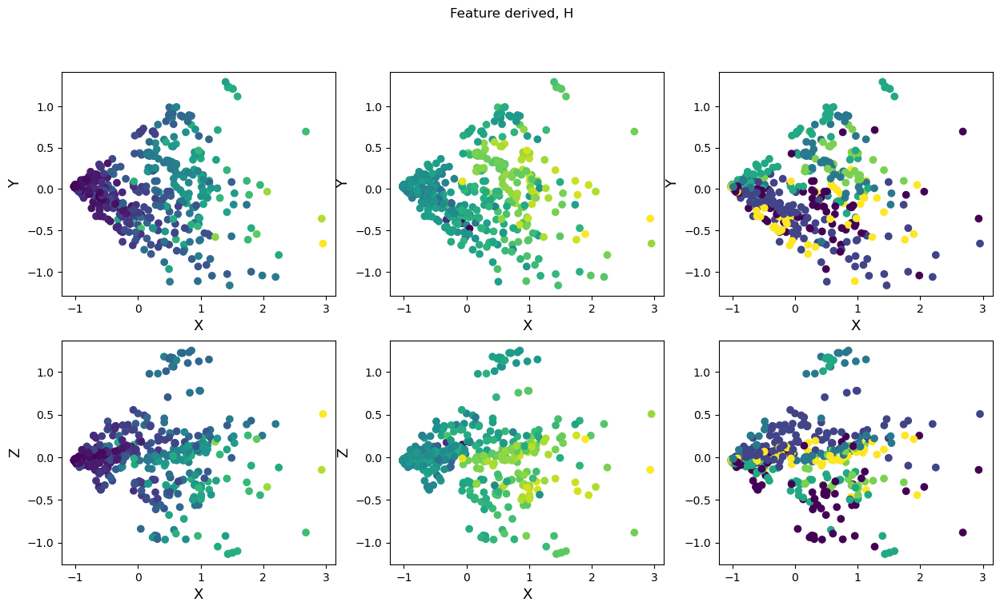

In [199]:
dGnorm = colors.Normalize(vmin=dG.min(), vmax=dG.max())
c=dGnorm(dG)

cdiff= (dG_pos -dG_neg)
cdiffnorm=colors.Normalize(vmin=cdiff.min(), vmax=cdiff.max())
cdiff = cdiffnorm(cdiff)
c_labels=label_H/label_H.max()
rows = 2
cols = 3
plt.figure(figsize=(15,8))
plt.suptitle("Feature derived, H")
plt.subplot(rows,cols ,1)
plt.scatter(pca_H[:,0], pca_H[:,1], c=cmap(c))
plt.xlabel("X",fontsize=fontsize)
plt.ylabel("Y",fontsize=fontsize)

plt.subplot(rows,cols,2)
plt.scatter(pca_H[:,0], pca_H[:,1], c=cmap(cdiff))
plt.xlabel("X",fontsize=fontsize)
plt.ylabel("Y",fontsize=fontsize)

plt.subplot(rows,cols,3)
plt.scatter(pca_H[:,0], pca_H[:,1], c=cmap(c_labels))
plt.xlabel("X",fontsize=fontsize)
plt.ylabel("Y",fontsize=fontsize)

plt.subplot(rows,cols,4)
plt.scatter(pca_H[:,0], pca_H[:,2], c=cmap(c))
plt.xlabel("X",fontsize=fontsize)
plt.ylabel("Z",fontsize=fontsize)

plt.subplot(rows,cols,5)
plt.scatter(pca_H[:,0], pca_H[:,2], c=cmap(cdiff))
plt.xlabel("X",fontsize=fontsize)
plt.ylabel("Z",fontsize=fontsize)

plt.subplot(rows,cols,6)
plt.scatter(pca_H[:,0], pca_H[:,2], c=cmap(c_labels))

plt.savefig("./plots/NMF_H_degrees.png")

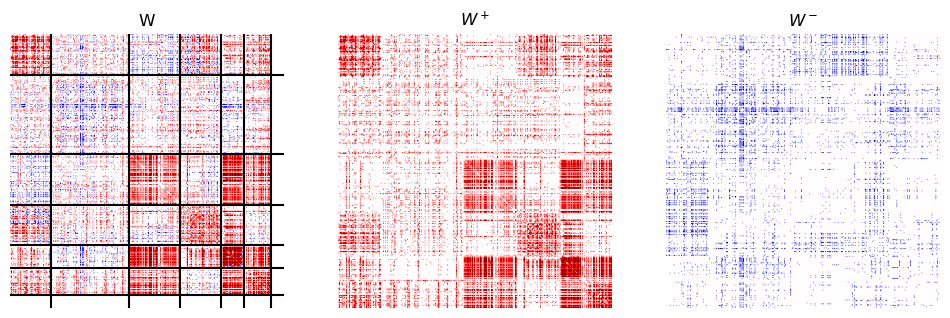

In [127]:
Weight_plots(We, W_pos, W_neg, label_H)#, "NMF_Weight")

## different k

In [81]:
np.arange(10,70,10)

array([10, 20, 30, 40, 50, 60])

In [82]:
def different_k(d_all, D_pos, W_pos, W_neg):
    k_list = np.arange(2,9)
    k_list=np.append( k_list, np.arange(10,70,10) )
    res=np.zeros((5, k_list.shape[0])) #7
    std = np.zeros_like(res)
    
    for i,k in enumerate(k_list):
        L_BR = build_L_BR(W_pos, W_neg)
        #label_BR = spectral_clustering(L_BR, k)

        L_BN = build_L_BN(W_pos, W_neg)
        #label_BN = spectral_clustering(L_BN, k)

        L_SR = build_L_SR(W_pos, W_neg)
        #label_SR = spectral_clustering(L_SR, k)

        L_SN= build_L_SN(W_pos, W_neg)#np.diag((d_all)**(-0.5)) @L_SR @ np.diag((d_all)**(-0.5))
        
        L_AM = build_L_AM(W_pos, W_neg)
        
        L_GM=build_L_GM(W_pos, W_neg)
        #label_SN = spectral_clustering(L_SR, k)
        
        H,W=load_matrix(k)
        
        label_H=np.argmax(H, axis=0)
        
        """
        Pay attention, since I use not the same graphs here
        """

        #Laplacians=[L_BR, L_BN, L_SR, L_SN, L_AM, L_GM, H]
        Laplacians=[ L_BN, L_SN, L_AM, L_GM, H]
        
        N=len(Laplacians)
        for j,L in enumerate(Laplacians):
            
            if j!=N-1:
                label=spectral_clustering(L, k)
            
            elif j==N-1: #last element corresponds to semNF
                label=label_H
               
            
            _, counts = np.unique(label, return_counts=True)
            
            diff=counts.max() - counts.min()
            res[j][i] = diff
            std[j][i] = np.std(counts)
            
    return k_list, res, std      

def load_matrix(k, root="./"):
    path_H=root+"H"+str(k)+".mat"
    path_W=root+"W"+str(k)+".mat"
    H=loadmat(path_H)
    W=loadmat(path_W)
    
    H=H["H"]
    W=W["W"]
    return H,W
    

In [83]:
def different_k_plot(k_list,res, std, savetitle=None):
    root="./plots/"
    fontsize = 13
    #plt.figure(figsize=(15,5))
    plt.figure(figsize=(10,12))
    
    #labels=["$L_{BR}$", "$L_{BN}$", "$L_{SR}$", "$L_{SN}$", "$L_{AM}$", "$L_{GM}$", "Semi NMF"]
    
    labels=["$L_{BN}$",  "$L_{SN}$", "$L_{AM}$", "$L_{GM}$", "Semi NMF"]
    #plt.subplots(2,1,sharex='col')
    plt.subplot(2,1,1)
    for i in range(res.shape[0]):
        plt.plot(k_list, res[i,:] , "-o" ,label=labels[i])
        
    plt.title("Range of Community Sizes", fontsize=15)
    plt.ylabel("Range", fontsize=fontsize)
    plt.xlabel("No. of Communiites",  fontsize=fontsize)
    plt.legend(fontsize=fontsize)
    
    plt.subplot(2,1,2)
    for i in range(res.shape[0]):
        plt.plot(k_list, std[i,:] , "-o" ,label=labels[i])
        
    plt.title("Standard Deviation of Community Sizes", fontsize=15)
    plt.ylabel("Standard Deviation", fontsize=fontsize)
    plt.xlabel("No. of Communiites" , fontsize=fontsize)
    plt.legend(fontsize=fontsize)
    
    if savetitle!=None:
        plt.savefig(root+savetitle+".png")

In [84]:
k_list, res, std=different_k(d, D_pos, W_pos, W_neg)

C:\Users\sujen\Documents\HS22_Programme\HS2022_MAT933_Project\Code\Laplacians.py:110: ComplexWarning: Casting complex values to real discards the imaginary part
  A_negsqrt[non_zero]= 1/np.sqrt(A[non_zero])
C:\Users\sujen\Documents\HS22_Programme\HS2022_MAT933_Project\Code\Laplacians.py:110: ComplexWarning: Casting complex values to real discards the imaginary part
  A_negsqrt[non_zero]= 1/np.sqrt(A[non_zero])
C:\Users\sujen\Documents\HS22_Programme\HS2022_MAT933_Project\Code\Laplacians.py:110: ComplexWarning: Casting complex values to real discards the imaginary part
  A_negsqrt[non_zero]= 1/np.sqrt(A[non_zero])
C:\Users\sujen\Documents\HS22_Programme\HS2022_MAT933_Project\Code\Laplacians.py:110: ComplexWarning: Casting complex values to real discards the imaginary part
  A_negsqrt[non_zero]= 1/np.sqrt(A[non_zero])
C:\Users\sujen\Documents\HS22_Programme\HS2022_MAT933_Project\Code\Laplacians.py:110: ComplexWarning: Casting complex values to real discards the imaginary part
  A_negsqrt

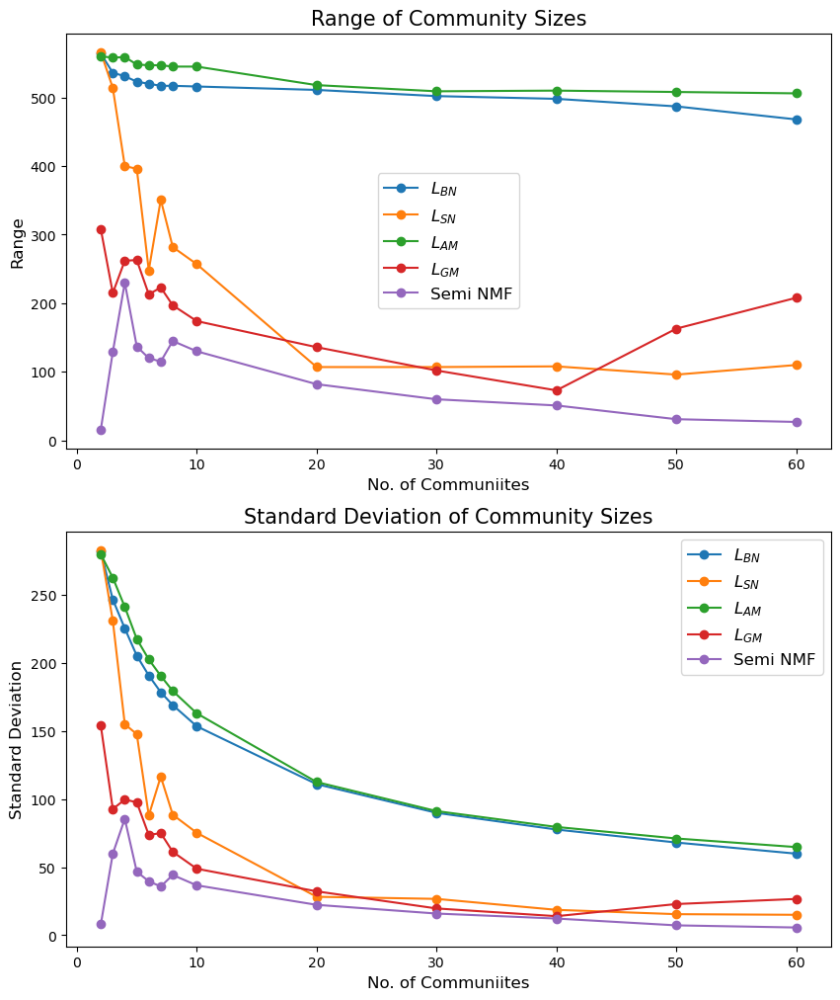

In [86]:
different_k_plot(k_list, res, std, "Community_sizes")

# Statistics

In [141]:
def analyze_PC(L_signed,G, border=0, left=True):
    pca=KernelPCA(n_components=3)
    pca_L = pca.fit_transform(L_signed)
    
    if left:
        first= (pca_L[:,0]<border)
        second=(pca_L[:, 1]<border)
    else:
        first= (pca_L[:,0]>border)
        second=(pca_L[:, 1]>border)
    
    nodes=list(G.nodes())
    nodes=np.asarray(nodes)
    
    sub_nodes=nodes[first]
    G_sub = G.subgraph(sub_nodes)
    start=time.time()
    
    n_ub, n_wb, n_sb, n_triangles= triad_types(G_sub)
    
    
    
    print("1st component: ")
    print(" unbalanced: {}, {}%".format(n_ub, np.round(n_ub/n_triangles*100,2)))
    print(" weakly balanced: {}, {}%".format(n_wb, np.round(n_wb/n_triangles*100, 2)))
    print(" strongly balanced: {}, {}%".format(n_sb, np.round(n_sb/n_triangles*100,2)))
    print(" total triangles: {}".format(n_triangles))
    
    sub_nodes=nodes[second]
    G_sub = G.subgraph(sub_nodes)
    
    n_ub, n_wb, n_sb, n_triangles= triad_types(G_sub)
    
    print("2nd component: ")
    print(" unbalanced: {}, {}%".format(n_ub, np.round(n_ub/n_triangles*100,2)))
    print(" weakly balanced: {}, {}%".format(n_wb, np.round(n_wb/n_triangles*100, 2)))
    print(" strongly balanced: {}, {}%".format(n_sb, np.round(n_sb/n_triangles*100,2)))
    print(" total triangles: {}".format(n_triangles))
    
    print("time: {} s".format(time.time()-start))
    
    

In [129]:
analyze_PC(L_GM, Gt)

(568, 3)
1st component: 
 unbalanced: 118, 5.16%
 weakly balanced: 1355, 59.3%
 strongly balanced: 812, 35.54%
 total triangles: 2285
2nd component: 
 unbalanced: 19794, 6.35%
 weakly balanced: 809, 0.26%
 strongly balanced: 291353, 93.4%
 total triangles: 311956
time: 442.9358444213867 s


In [136]:
35.54+59.3

94.84

In [130]:
analyze_PC(H.T,Gt)

(568, 3)
1st component: 
 unbalanced: 300, 13.16%
 weakly balanced: 611, 26.8%
 strongly balanced: 1369, 60.04%
 total triangles: 2280
2nd component: 
 unbalanced: 8071, 13.09%
 weakly balanced: 3756, 6.09%
 strongly balanced: 49818, 80.81%
 total triangles: 61645
time: 2.139742374420166 s


In [131]:
analyze_PC(L_SN, Gt)

(568, 3)
1st component: 
 unbalanced: 44723, 9.52%
 weakly balanced: 7631, 1.63%
 strongly balanced: 417190, 88.85%
 total triangles: 469544
2nd component: 
 unbalanced: 733, 15.6%
 weakly balanced: 913, 19.43%
 strongly balanced: 3052, 64.96%
 total triangles: 4698
time: 428.5644338130951 s


In [132]:
analyze_PC(L_BN, Gt)

(568, 3)
1st component: 
 unbalanced: 45793, 9.78%
 weakly balanced: 7308, 1.56%
 strongly balanced: 415258, 88.66%
 total triangles: 468359
2nd component: 
 unbalanced: 43399, 9.43%
 weakly balanced: 6942, 1.51%
 strongly balanced: 409934, 89.06%
 total triangles: 460275
time: 627.4841239452362 s


In [133]:
analyze_PC(W, Gt)

(568, 3)
1st component: 
 unbalanced: 7866, 15.54%
 weakly balanced: 1971, 3.89%
 strongly balanced: 40795, 80.57%
 total triangles: 50632
2nd component: 
 unbalanced: 9941, 4.37%
 weakly balanced: 1484, 0.65%
 strongly balanced: 215902, 94.97%
 total triangles: 227327
time: 34.68126034736633 s


In [139]:
3.89+ 80.57

84.46

In [144]:
analyze_PC(W, Gt, 0.4, False)

1st component: 
 unbalanced: 8597, 3.28%
 weakly balanced: 0, 0.0%
 strongly balanced: 253284, 96.72%
 total triangles: 261881
2nd component: 
 unbalanced: 31, 0.62%
 weakly balanced: 4, 0.08%
 strongly balanced: 4965, 99.3%
 total triangles: 5000
time: 245.32513666152954 s


In [75]:

print("cbi BR: {}".format(cbi_BR))
print("cbi BN: {}".format(cbi_BN))
print("cbi SR: {}".format(cbi_SR))
print("cbi SN: {}".format(cbi_SN))
print("cbi AM: {}".format(cbi_AM))
print("cbi GM: {}".format(cbi_GM))

cbi BR: 86.22600797129604
cbi BN: 82.5802552528247
cbi SR: 87.52256835965673
cbi SN: 90.62621573572991
cbi AM: 89.32319853961822
cbi GM: 86.63122819578518


In [146]:
print("L_SN")
calculate_difference(label_SN, Gt)

L_SN


array([[1.457, 1.294, 1.457],
       [1.294, 4.802, 4.802],
       [1.457, 4.802, 0.   ]])

In [139]:
print("L_GM")
calculate_difference(label_GM, Gt)

L_GM


array([[1.418, 0.741, 2.306],
       [0.741, 0.517, 1.457],
       [2.306, 1.457, 3.235]])

In [160]:
print("semi_NMF")
calculate_difference(label_H, Gt)

semi_NMF


array([[0.904, 1.342, 1.458],
       [1.342, 2.254, 1.731],
       [1.458, 1.731, 4.286]])

# Plots for Report

## Weights

In [172]:
def sort_W(W, label):
    
    idx=np.argsort(label)
    
    W=W[idx,:]
    W=W[:, idx]
    
   
    return W



(-0.5, 594.325, 594.325, -0.5)

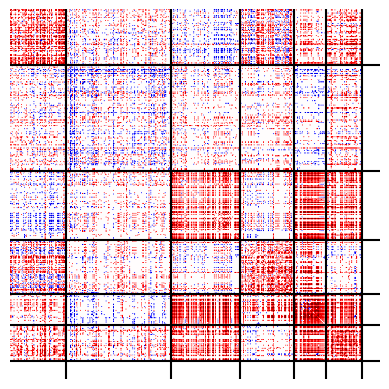

In [173]:

label=label_H
#values, count = np.unique(label, return_counts=True)

plt.imshow(sort_W(We,label), vmin=-1, vmax=1)
draw_communities(label)
#c_sum=0
#for c in count:
#    c_sum += c
#    plt.axvline(x=c_sum, c="black")
#    plt.axhline(y=c_sum, c = "black")
#plt.set_cmap(c)
plt.axis('off')



    
    

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

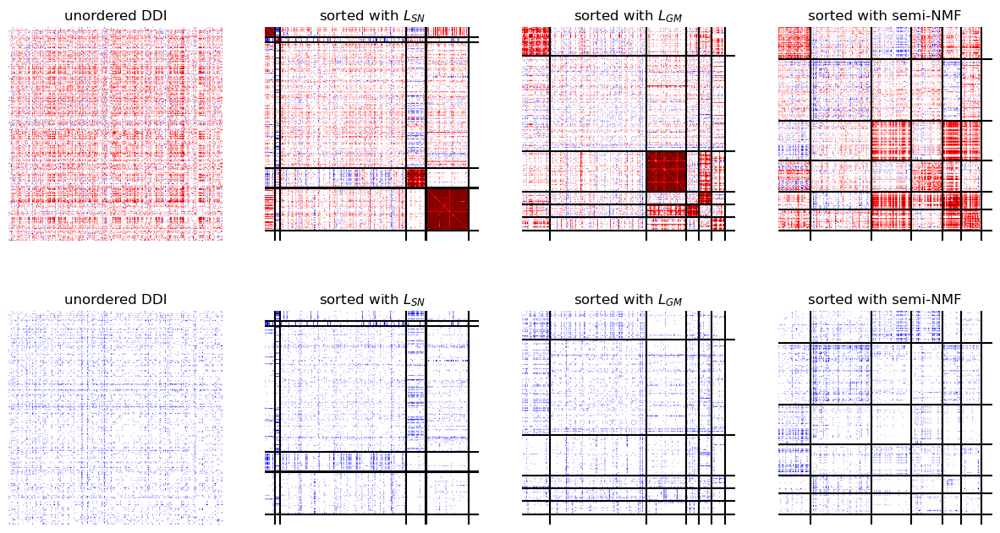

In [176]:


col = 4
row =2
offset=4
c = "seismic"
plt.figure(figsize=(15,8))
magnitude=[1,-1]


for i,W in enumerate([We, W_neg]):
    
    m=magnitude[i]
    plt.subplot(row,col,1+offset*i)
    plt.imshow(W*m, vmin=-1, vmax=1)
    plt.title("unordered DDI")
    plt.set_cmap(c)
    plt.axis('off')

    plt.subplot(row,col,2+i*offset)
    plt.imshow(sort_W(W, label_SN)*m, vmin=-1, vmax=1)
    draw_communities(label_SN)
    plt.title("sorted with $L_{SN}$")
    plt.set_cmap(c)
    plt.axis('off')

    plt.subplot(row,col,3+i*offset)
    plt.imshow(sort_W(W, label_GM)*m, vmin=-1, vmax=1)
    draw_communities(label_GM)
    plt.title("sorted with $L_{GM}$")
    plt.set_cmap(c)
    plt.axis('off')
    
    plt.subplot(row, col, 4+i*offset)
    plt.imshow(sort_W(W, label_H)*m, vmin=-1, vmax=1)
    draw_communities(label_H)
    plt.title("sorted with semi-NMF")
    plt.set_cmap(c)
    plt.axis('off')
    





#plt.subplot(1,3,2)
#plt.imshow(W_pos,vmin=-1, vmax=1)
#plt.title("$W^+$")
#plt.axis('off')

#plt.subplot(1,3,3)
#plt.imshow(W_neg*-1, vmin=-1, vmax=1)
#plt.title("$W^-$")

plt.set_cmap(c)
plt.axis('off')

plt.savefig("./plots/Weights_comparisions.png")

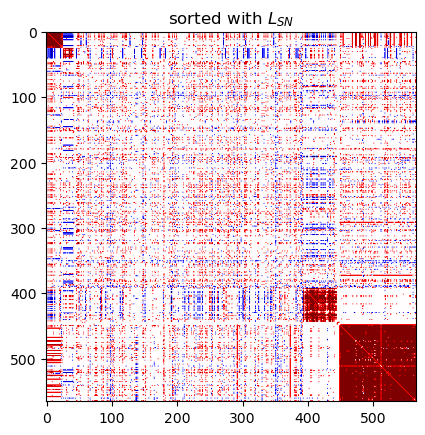

In [163]:
plt.imshow(sort_W(We, label_SN), vmin=-1, vmax=1)
plt.title("sorted with $L_{SN}$")
plt.set_cmap(c)


(400.0, 325.0)

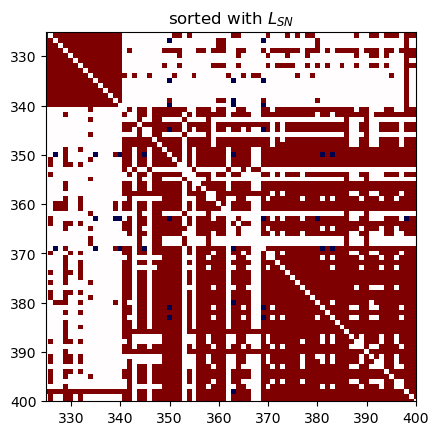

In [102]:
plt.imshow(sort_W(We, label_SN), vmin=-1, vmax=1)
plt.title("sorted with $L_{SN}$")
plt.set_cmap(c)

plt.xlim(325,400)
plt.ylim(400,325)

## Centrality Plot

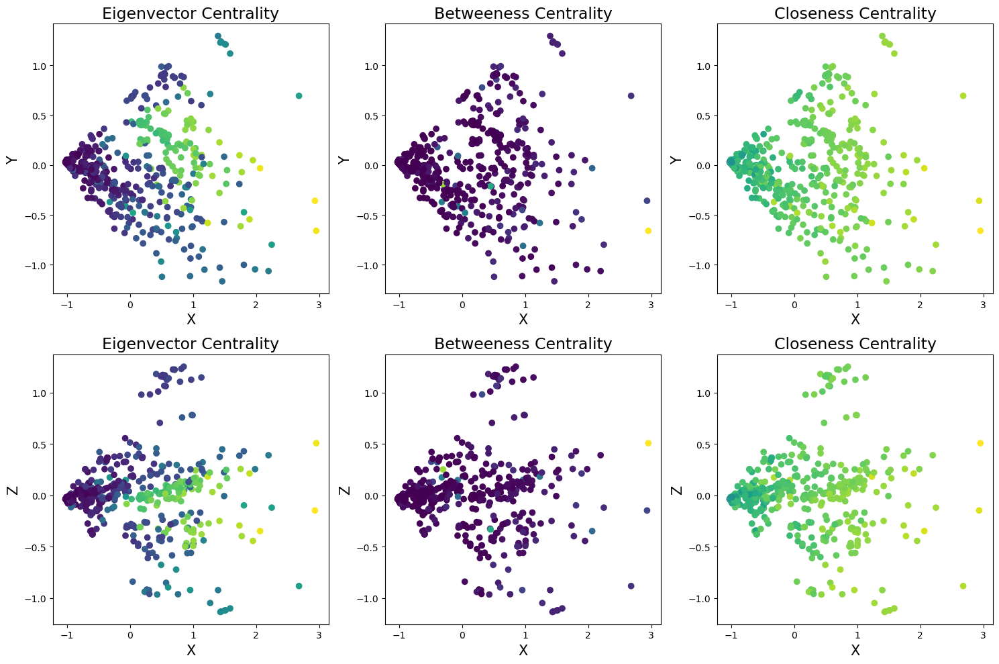

In [172]:

L_signed = H.T
name="T"

pca=KernelPCA(n_components=3)
pca_L = pca.fit_transform(L_signed)
titles=centralites_titles


cols = len(centralities)
rows = 2
offset=cols
fig=plt.figure(figsize=(15,10))
#plt.subplots(rows, cols, sharey=True)

fontsize= 15
title_size=17

for i,c in enumerate(centralities):

    col= np.asarray(list(c.values()))
    vmin=col.min()
    vmax=col.max()

    norm = colors.Normalize(vmin=vmin, vmax=vmax)
    col=cmap(norm(col))

    
    
    plt.subplot(rows,cols,i+1)
    plt.scatter(pca_L[:,0], pca_L[:,1], c = col)
    plt.xlabel("X", fontsize =fontsize)
    plt.ylabel("Y", fontsize =fontsize)
    plt.title(titles[i], fontsize=title_size)

    plt.locator_params(axis='y', nbins=6)
    plt.locator_params(axis='x', nbins=6)
    
    plt.subplot(rows,cols,i+1+offset)
    plt.scatter(pca_L[:,0], pca_L[:,2], c= col)
    plt.xlabel("X", fontsize =fontsize)
    plt.ylabel("Z", fontsize =fontsize)
    plt.title(titles[i], fontsize=title_size)
    plt.locator_params(axis='y', nbins=6)
    plt.locator_params(axis='x', nbins=6)


plt.tight_layout()
#plt.autoscale(enable=True, axis='both', tight=None)
#plt.savefig("./plots/"+name+"_centrality.png")